In [ ]:
pip install umap-learn pacmap

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_blobs

import umap
from sklearn.manifold import TSNE
import pacmap

import warnings

#1

In [ ]:
def create_dataset(a):
    df = np.zeros((a, a))
    for i in range(a):
        start = i
        end = min(a, i+a//2)
        for j in range(start, end):
            df[i][j] = 1
    return df

In [ ]:
def info_dataset(df, df_name, view_flag = False):
  end = min(16, df.shape[0])
  if view_flag:
    print(df[:end, :end])
  print(f'Размер {df_name} -> {df.shape}')

In [ ]:
def visual_dataset(df_name, df):
    y_coords, x_coords = np.where(df == 1)

    plt.figure(figsize=(10, 10))
    plt.scatter(x_coords, y_coords, s=100)
    plt.gca().invert_yaxis()
    # plt.xticks(range(df.shape[1]))
    # plt.yticks(range(df.shape[0]))
    plt.xlabel('X-axis')
    plt.ylabel('Y-axis')
    plt.title(f'График для {df_name}')
    plt.show()
    print()

In [ ]:
A = [4, 16, 256]
datasets = {}

for a in A:
  datasets[f'df_{a}'] = create_dataset(a)

In [ ]:
for df_name, df in datasets.items():
  info_dataset(df, df_name)

Размер df_4 -> (4, 4)
Размер df_16 -> (16, 16)
Размер df_256 -> (256, 256)


In [ ]:
info_dataset(datasets['df_4'], 'df_4', view_flag=True)

[[1. 1. 0. 0.]
 [0. 1. 1. 0.]
 [0. 0. 1. 1.]
 [0. 0. 0. 1.]]
Размер df_4 -> (4, 4)


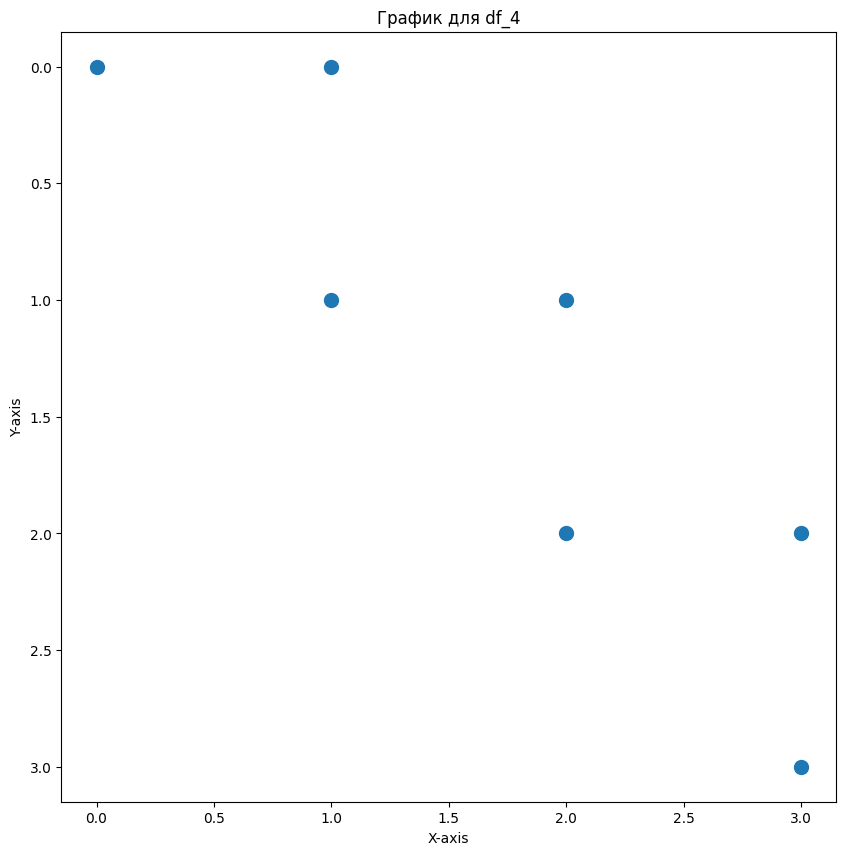

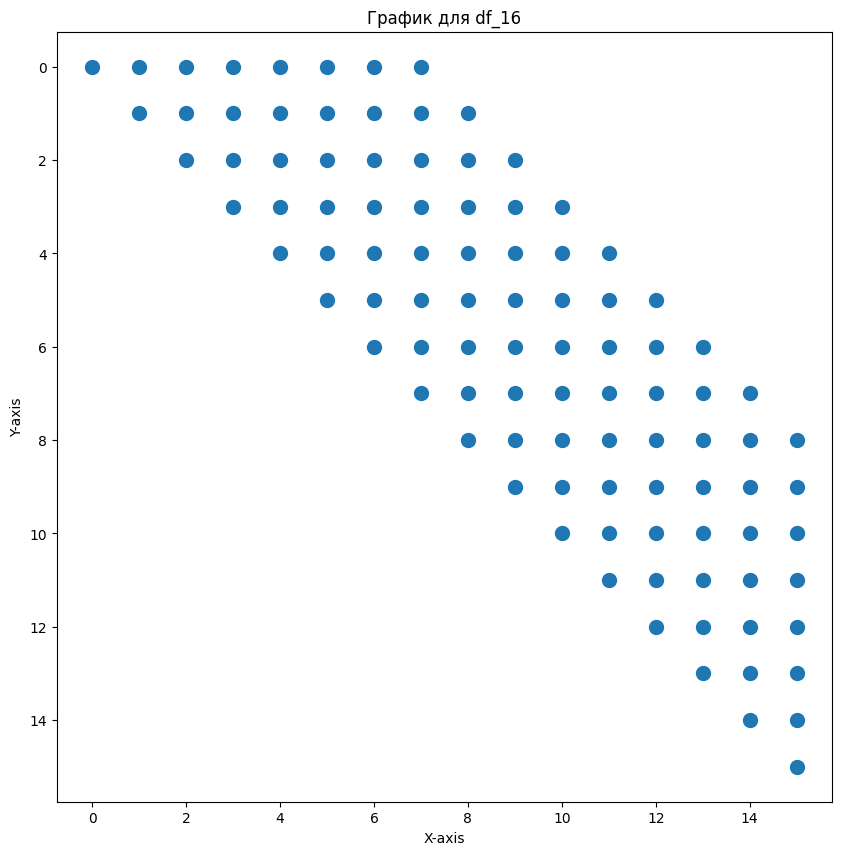

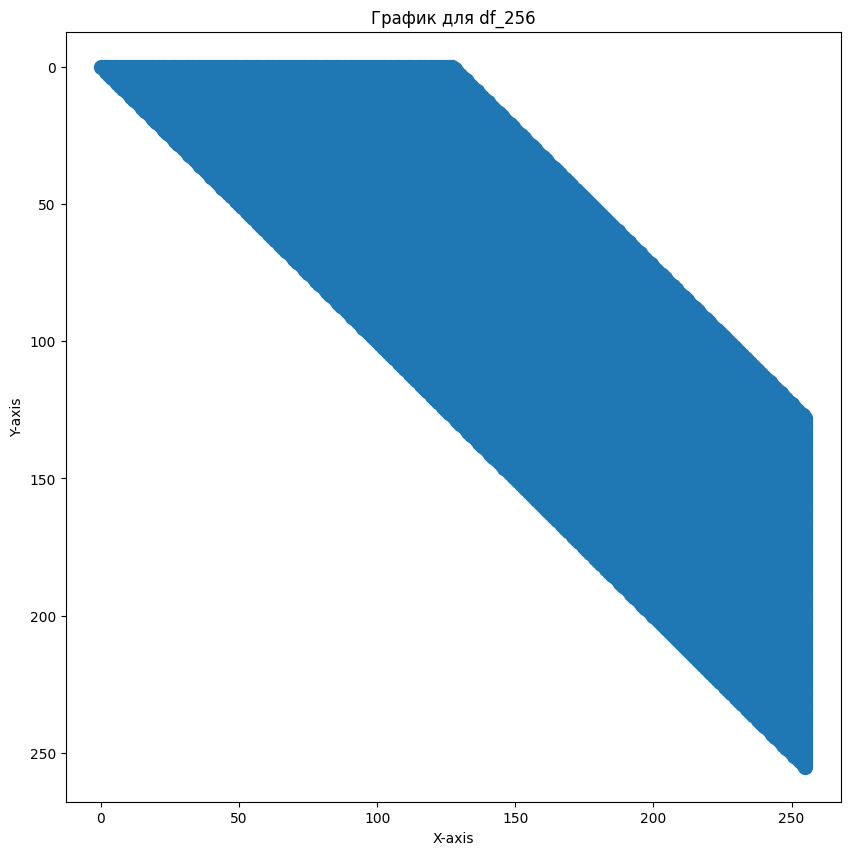

In [ ]:
for df_name, df in datasets.items():
    visual_dataset(df_name, df)

#2

In [ ]:
def calculate_scale(dataset_size):
    if dataset_size == 16:
        return 0.3
    elif dataset_size == 256:
        return 0.02
    elif dataset_size > 256:
        return 0.2
    else:
        return 1

In [ ]:
def get_components(df_name, df):
    #1. Стандартизация
    df_mean = np.mean(df, axis=0)
    df_std = np.std(df, axis=0)
    df_standart = (df - df_mean) / df_std

    #2. Вычисление ковариационной матрицы
    cov_matrix = np.cov(df_standart, rowvar=False)

    #3. Собственные значения и собственные векторы
    eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

    #4. Сортировка по убыванию собственных значений
    sorted_indices = np.argsort(eigenvalues)[::-1]

    eigenvalues = eigenvalues[sorted_indices]
    eigenvectors = eigenvectors[:, sorted_indices]

    #5. Проекция данных на главные компоненты
    df_pca = np.dot(df_standart, eigenvectors)

    variances = (eigenvalues / np.sum(eigenvalues))


    return df_pca, variances, eigenvectors

In [ ]:
def scree_plot(variances):
    total_variance = np.sum(variances)

    plt.figure(figsize=(8, 5))
    plt.plot(range(1, len(variances) + 1), variances, 'o-', linewidth=2)
    plt.title(f"Scree Plot (Total Variance = {100*total_variance:.2f}%)")
    plt.xlabel("Number of Components")
    plt.ylabel("Explained Variance (%)")
    plt.grid()
    plt.show()

In [ ]:
def visualization_pca(df_pca, eigenvectors=None, c=None, a=4, labels = None):
    if isinstance(df_pca, np.ndarray):
        if c:
            max_c = df_pca.shape[1]
            if max_c < c:
                c = max_c - a
            pca_selected = df_pca[:, c:c + a]
        else:
            pca_selected = df_pca[:, :a]
            c = 0
    elif isinstance(df_pca, pd.DataFrame):
        if c:
            max_c = df_pca.shape[1]
            if max_c < c:
                c = max_c - a
            pca_selected = df_pca.iloc[:, c:c + a].values
        else:
            pca_selected = df_pca.iloc[:, :a].values
            c = 0

    num_combinations = a * (a - 1)

    num_cols = int(np.ceil(num_combinations ** 0.5))
    num_rows = num_cols - 1

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 10))
    axes = axes.flatten()

    axes_id = 0

    for i in range(a):
      for j in range(a):
        if i != j:
          ax = axes[axes_id]
          if labels is not None:
              ax.scatter(pca_selected[:, i], pca_selected[:, j], c=labels, alpha = 0.3)
          else:
              ax.scatter(pca_selected[:, i], pca_selected[:, j], alpha = 0.3)

          if eigenvectors is not None:
            scale = calculate_scale(df_pca.shape[0])

            for k in range(df_pca.shape[1]):
              if i < eigenvectors.shape[0] and j < eigenvectors.shape[1]:
                # ax.quiver(0, 0, eigenvectors[i, k], eigenvectors[k, j], angles='xy',
                #           scale_units='xy', scale=scale, color='red')
                if k == i or k == j:
                  ax.quiver(0, 0, eigenvectors[i, k], eigenvectors[k, j], angles='xy',
                            scale_units='xy', scale=scale, color='red')

          ax.set_title(f'PC{c+i+1} and PC{c+j+1}')
          ax.set_xlabel(f'PC{c+i+1}')
          ax.set_ylabel(f'PC{c+j+1}')
          ax.grid(True)

          axes_id += 1

    #fig.colorbar(scatter, ax=axes, orientation='vertical', label='Class Label')
    plt.tight_layout()
    plt.show()

In [ ]:
datasets_pca = {}

In [ ]:
for df_name, df in datasets.items():
    df_pca, variances, eigenvectors = get_components(df_name, df)

    datasets_pca[f'{df_name}_pca'] = (df_pca, variances, eigenvectors)

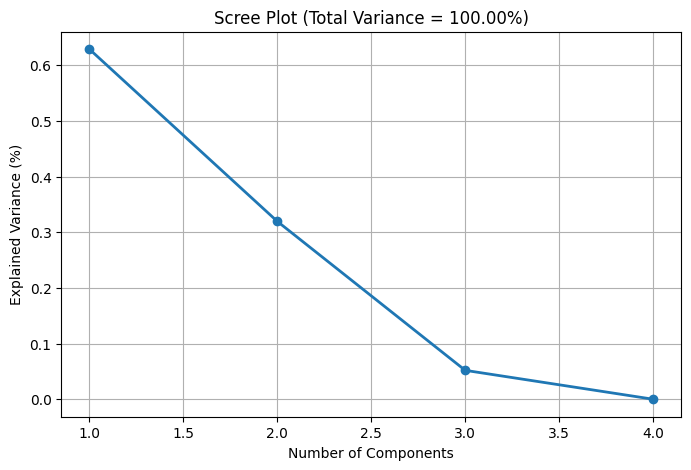

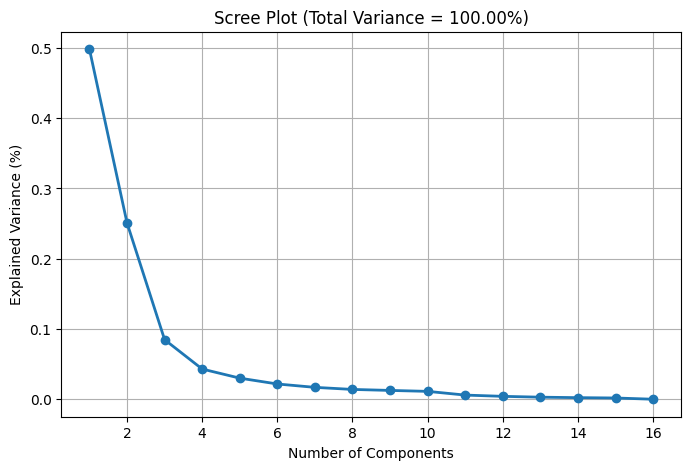

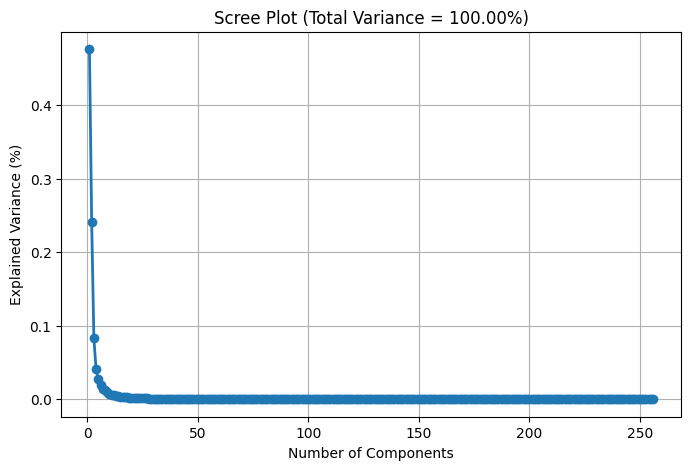

In [ ]:
for df_pca, variances, eigenvectors in datasets_pca.values():
  scree_plot(variances)

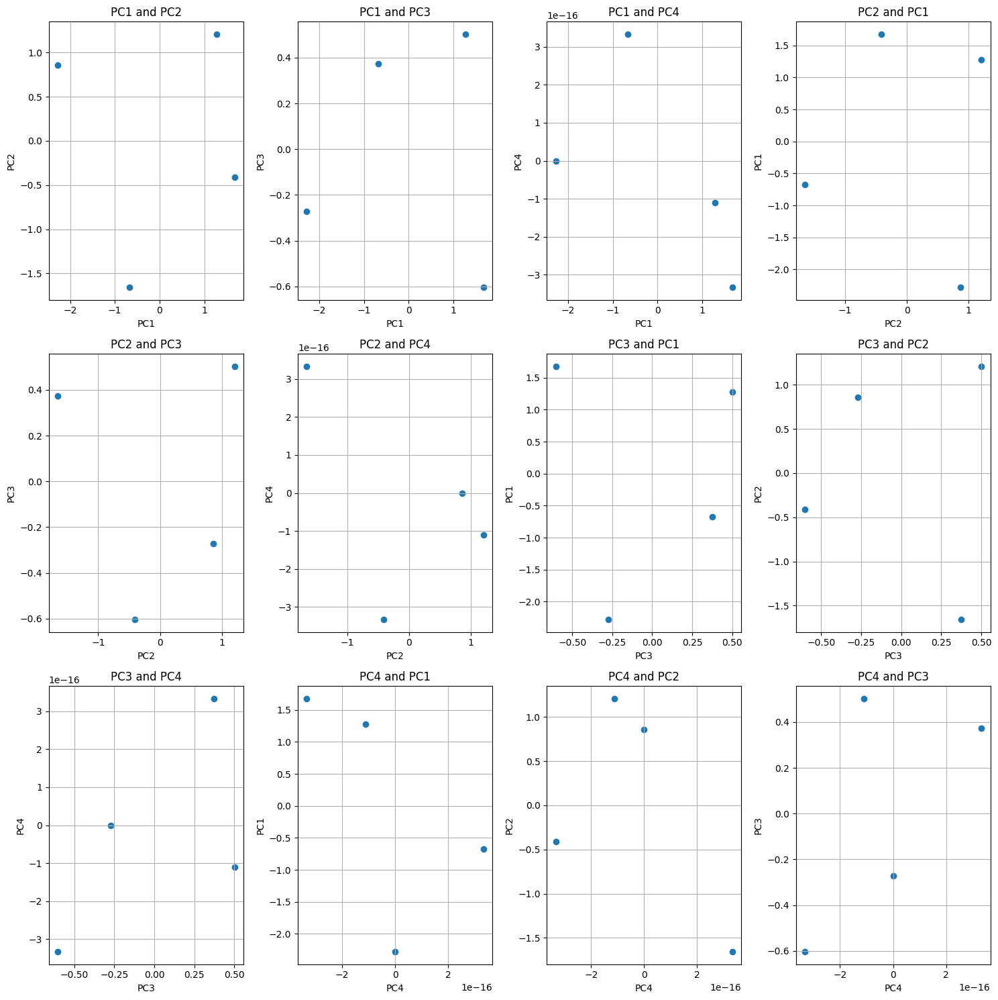

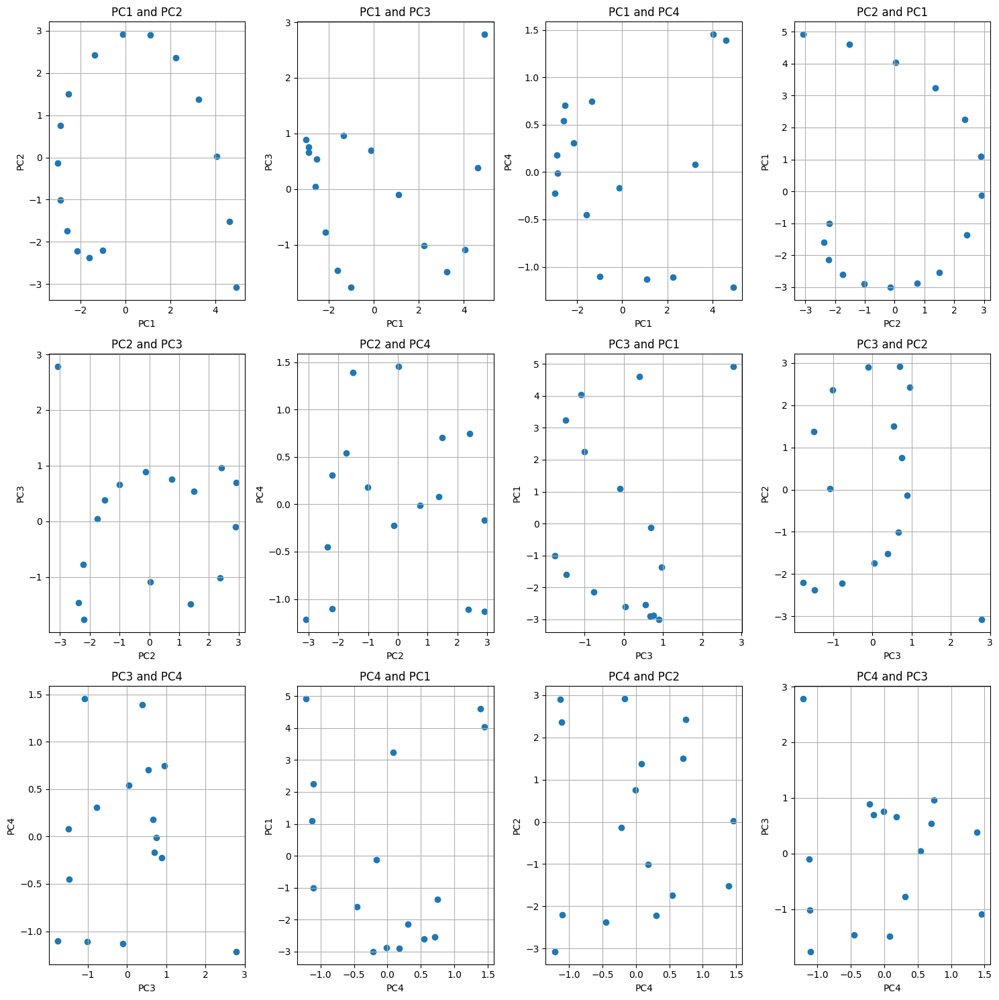

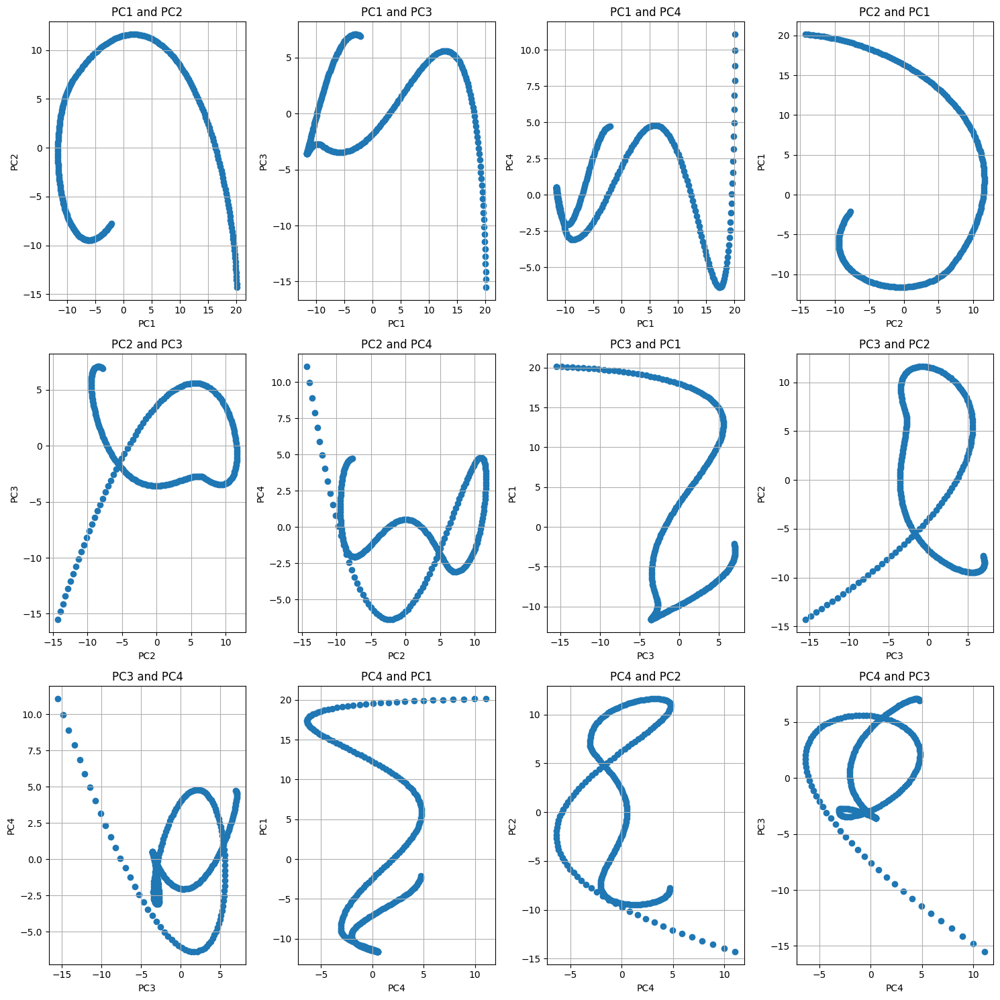

IndexError: index 2 is out of bounds for axis 1 with size 2

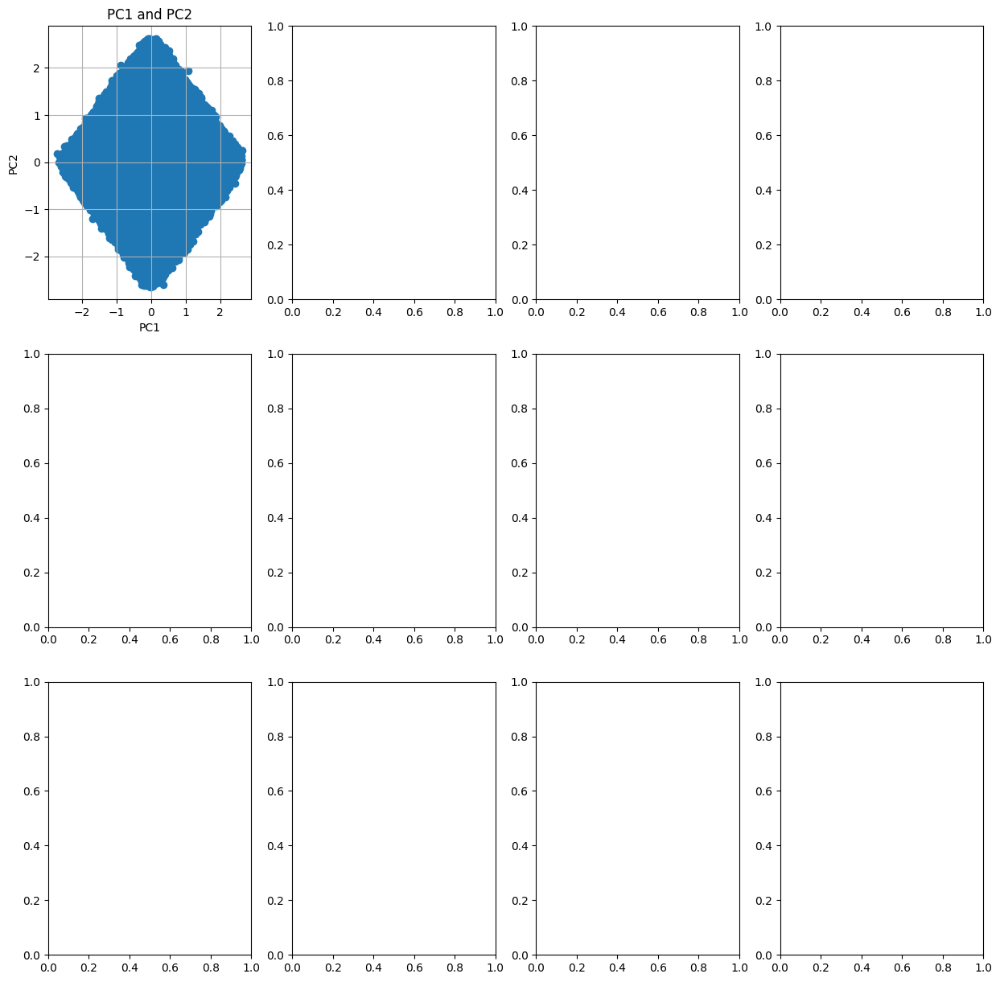

In [ ]:
for df_pca, variances, eigenvectors in datasets_pca.values():
  visualization_pca(df_pca)
  print()

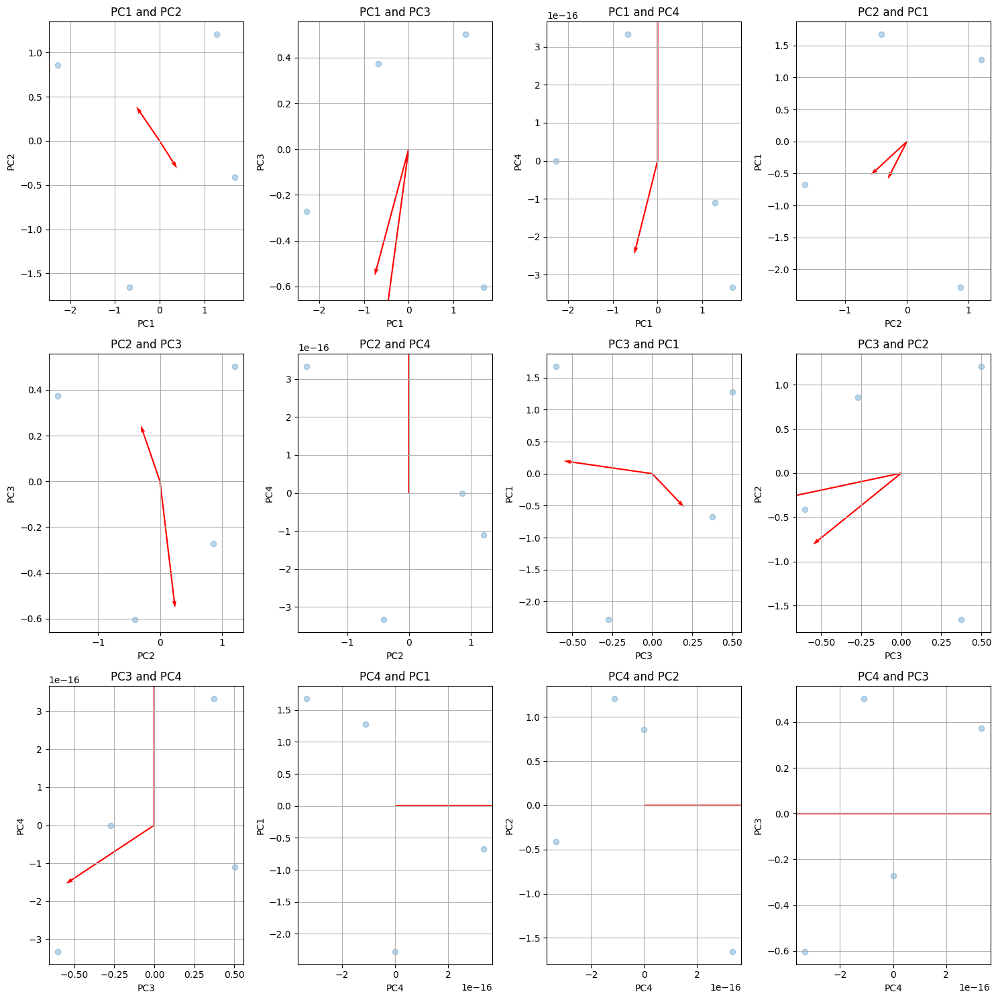

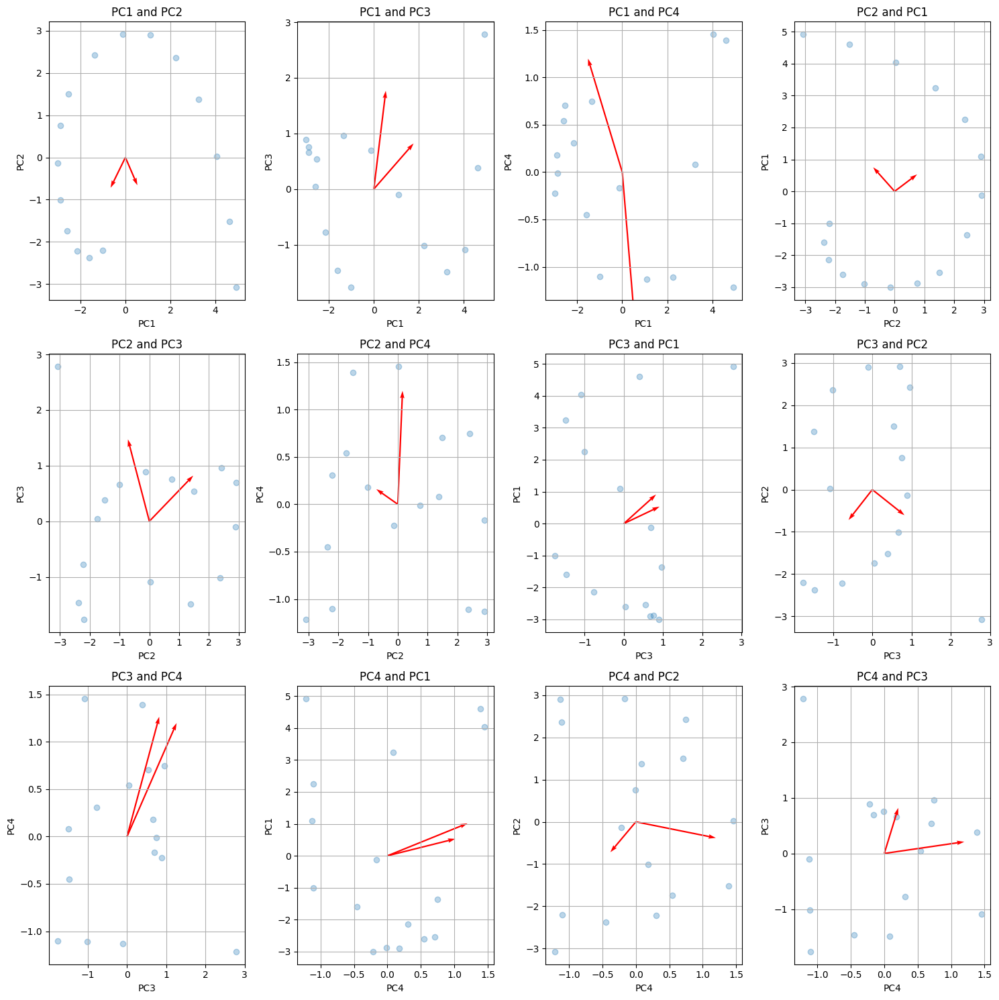

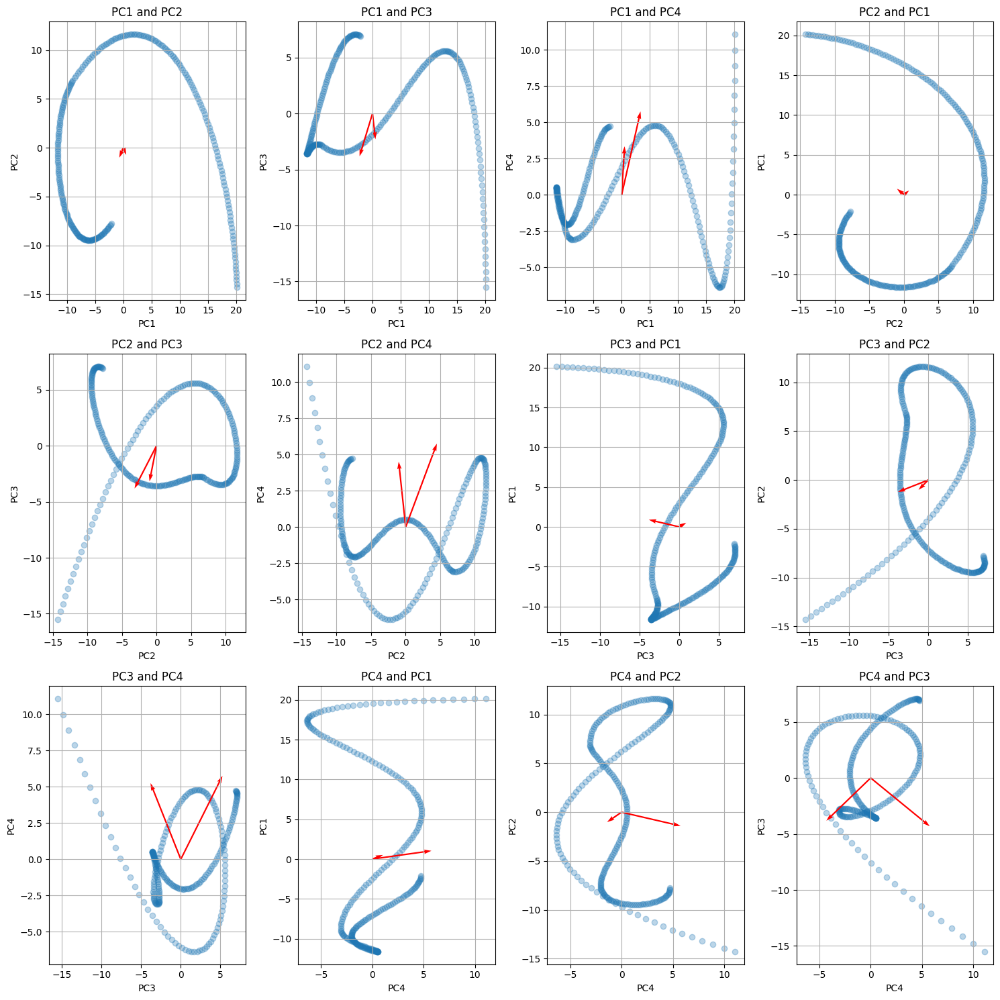

In [ ]:
for df_pca, variances, eigenvectors in datasets_pca.values():
  visualization_pca(df_pca, eigenvectors = eigenvectors)
  print()

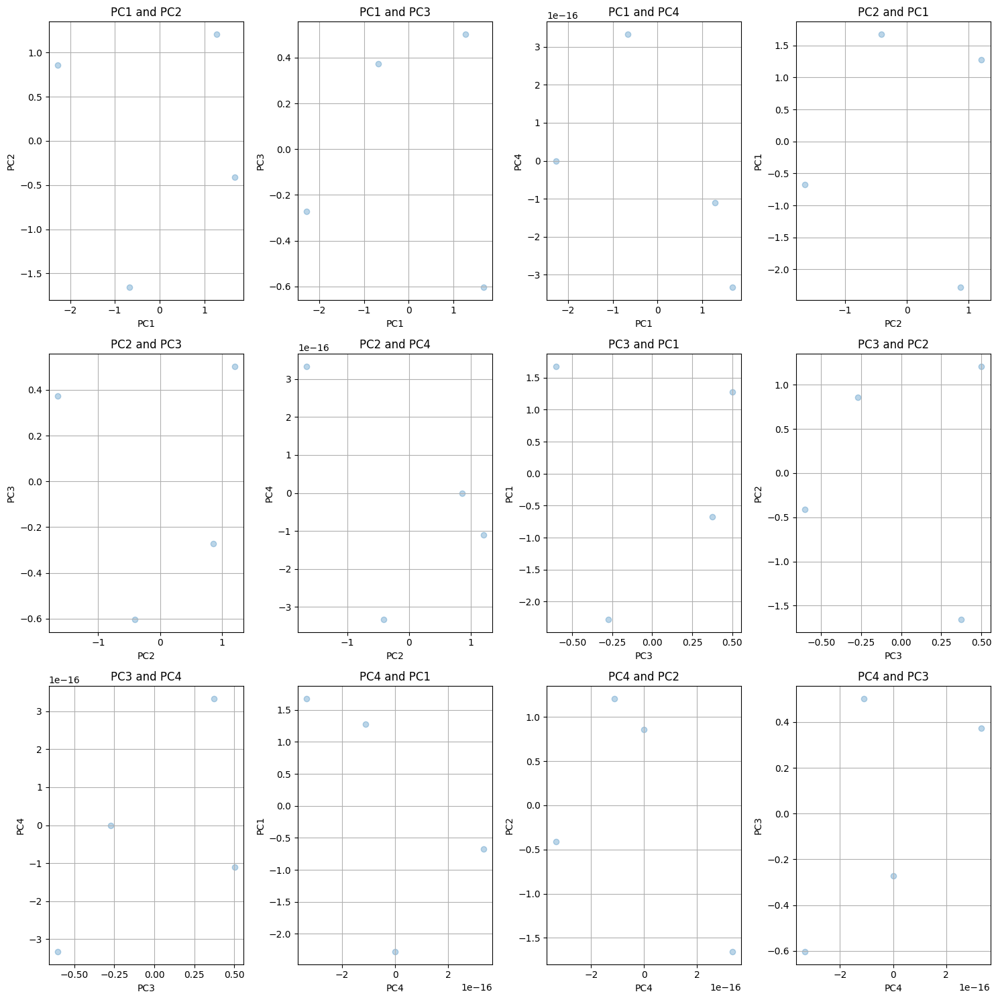

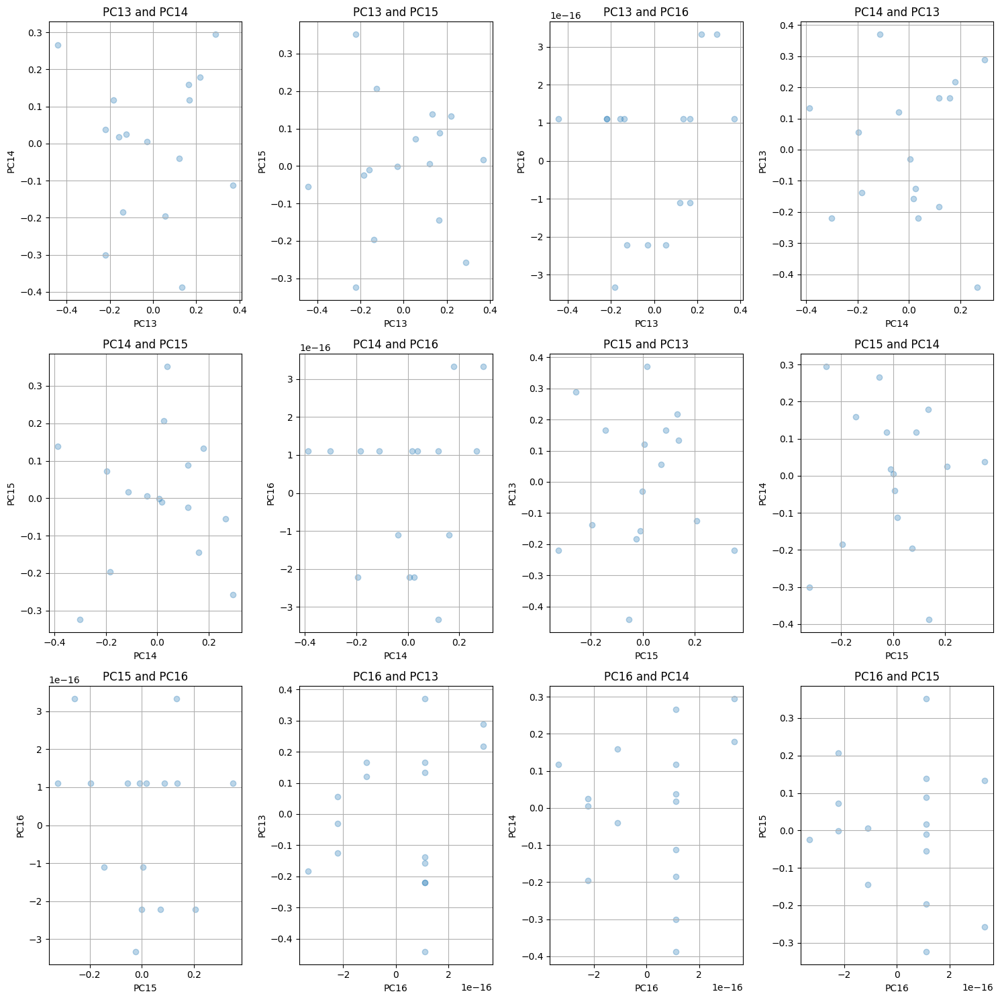

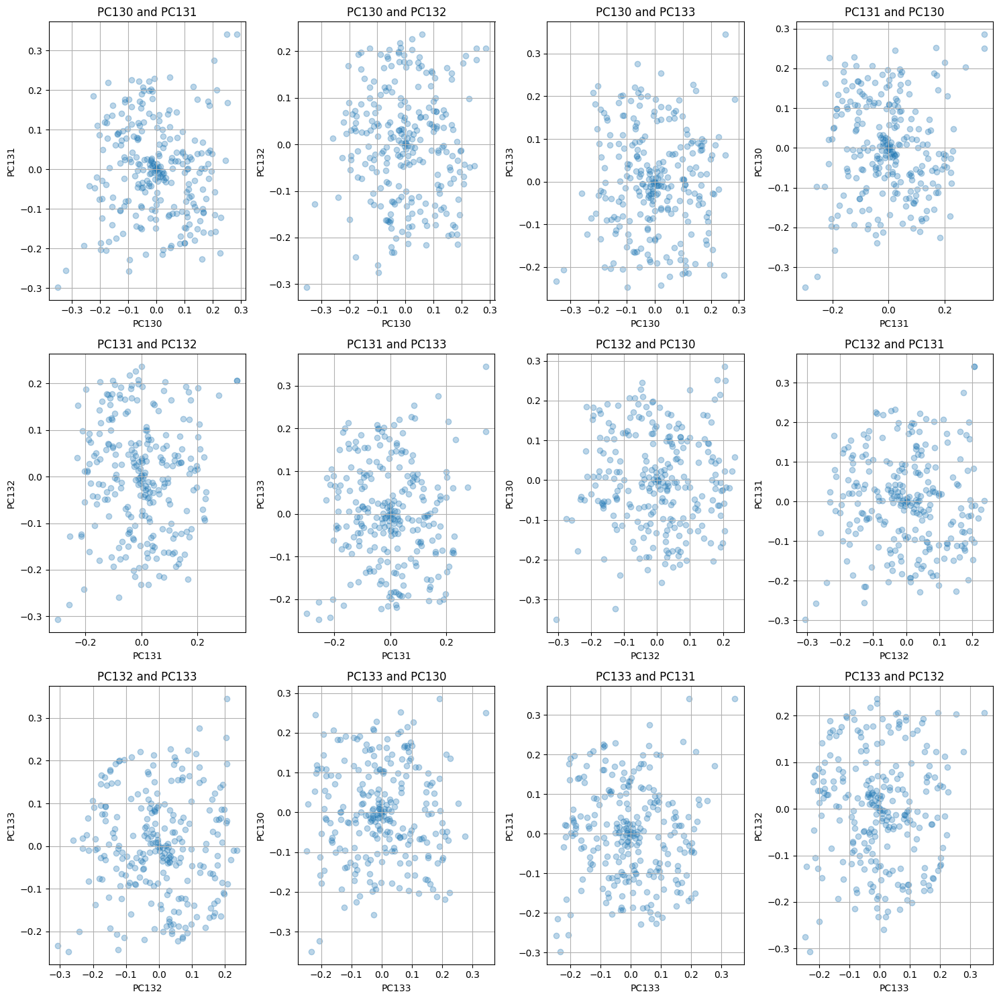

In [ ]:
for df_pca, variances, eigenvectors in datasets_pca.values():
  visualization_pca(df_pca, c = 129)
  print()

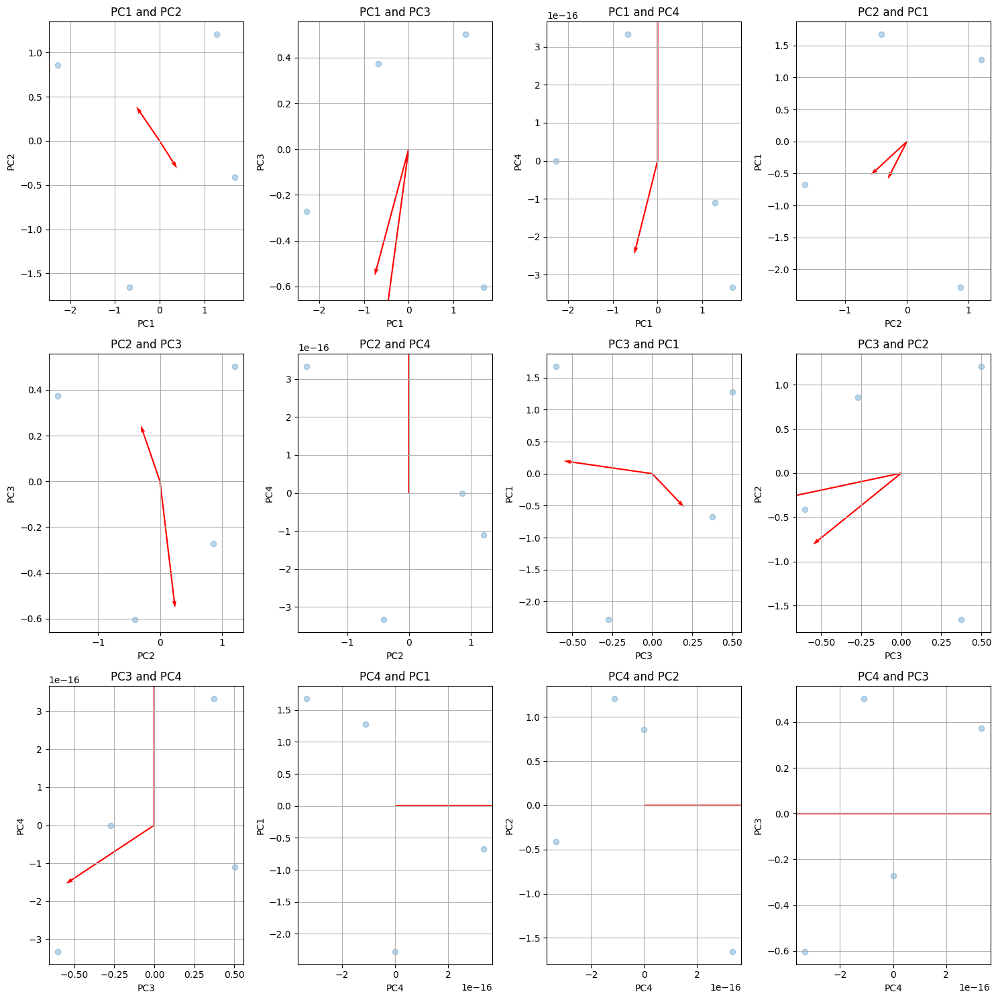

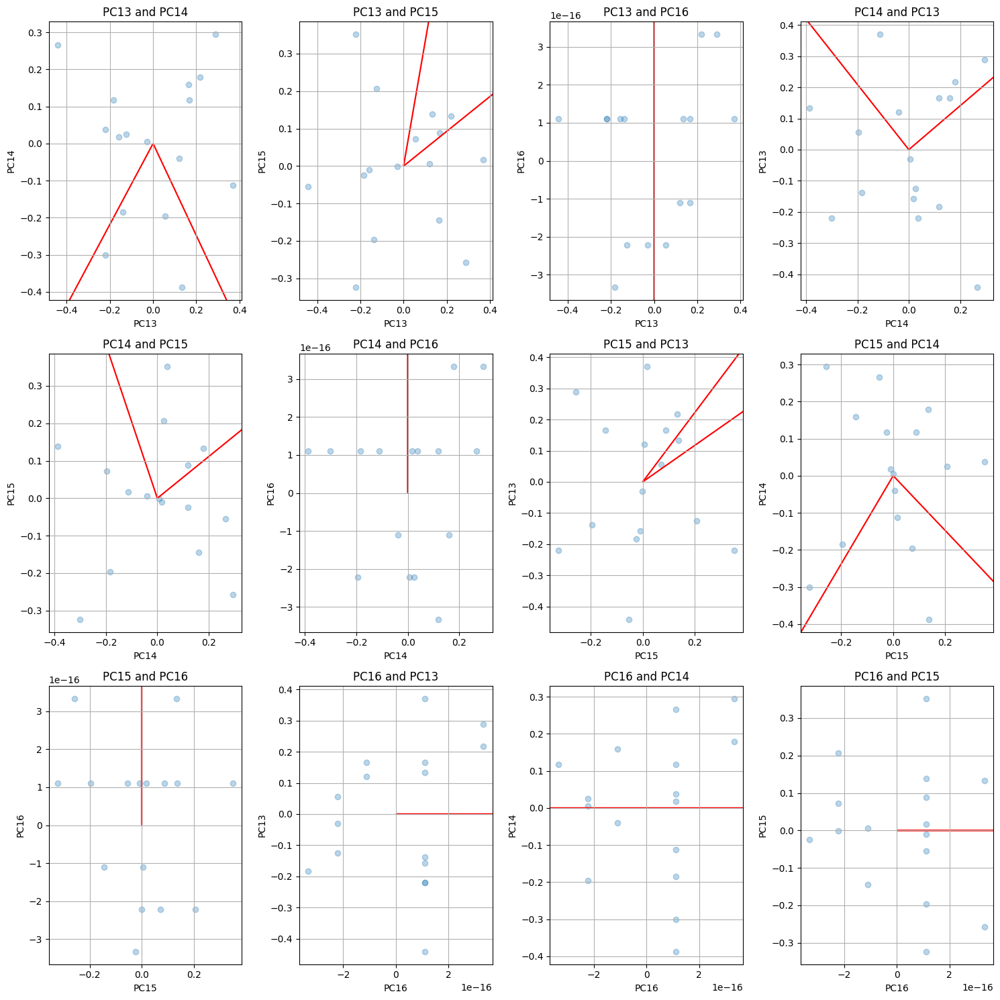

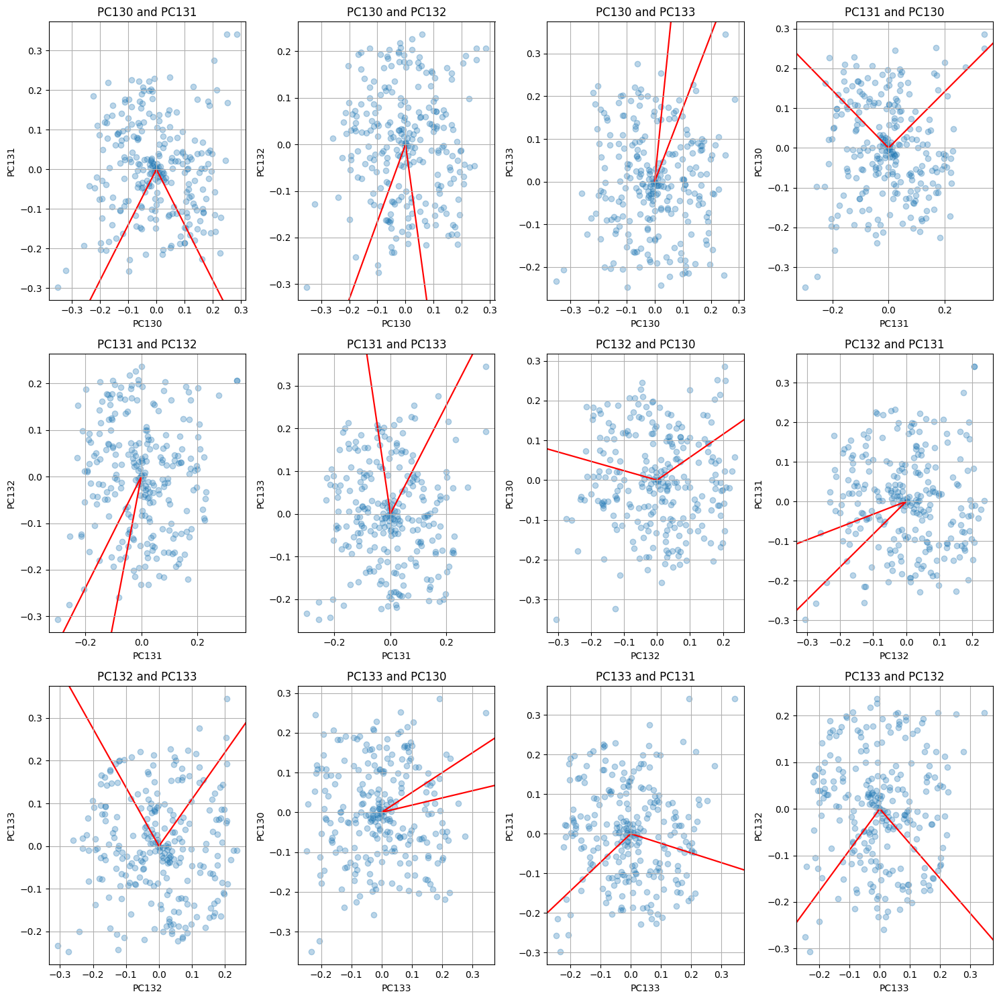

In [ ]:
for df_pca, variances, eigenvectors in datasets_pca.values():
  visualization_pca(df_pca, c = 129, eigenvectors = eigenvectors)
  print()

#Задание 3

In [ ]:
def plot_projection(method, df_a, random_states, palette, ax, label_prefix, labels):
    for i in range(random_states):
        if method == TSNE and df_a.shape[0] < 255:
            result = method(n_components=2, random_state=i, perplexity=1).fit_transform(df_a)
        elif method == pacmap.PaCMAP and df_a.shape[0] < 255:
            result = method(n_components=2, random_state=i, n_neighbors=1).fit_transform(df_a)
        elif method == TSNE and df_a.shape[0] > 256:
          result = method(n_components=2, random_state=i, perplexity=15).fit_transform(df_a)
        elif method == umap.UMAP and df_a.shape[0] > 256:
          result = method(n_components=2, random_state=i, n_neighbors=5).fit_transform(df_a)
        else:
            result = method(n_components=2, random_state=i).fit_transform(df_a)

        if labels is not None:
            ax.scatter(result[:, 0], result[:, 1], label=f'{label_prefix} (random state = {i+1})', c=labels, alpha=0.3)
        else:
          ax.scatter(result[:, 0], result[:, 1], label=f'{label_prefix} (random state = {i+1})', color=palette[i], alpha=0.3)

def visualize_methods(df_a, n_components=2, random_states=3, max_len = 1000, labels = None):
    if df_a.shape[0] > 256:
      df_a = df_a[:max_len]
      labels = labels[:max_len]

    palette = sns.color_palette("hls", random_states * 3)

    fig, axes = plt.subplots(2, 2, figsize=(15, 12))

    # 1. t-SNE
    plot_projection(TSNE, df_a, random_states, palette, axes[0, 0], 't-SNE', labels = labels)

    axes[0, 0].set_title(f't-SNE проекции с {random_states} рандом стейтами')
    axes[0, 0].set_xlabel('t-SNE1')
    axes[0, 0].set_ylabel('t-SNE2')

    # 2. UMAP
    plot_projection(umap.UMAP, df_a, random_states, palette, axes[0, 1], 'UMAP', labels = labels)

    axes[0, 1].set_title(f'UMAP проекции с {random_states} рандом стейтами')
    axes[0, 1].set_xlabel('UMAP1')
    axes[0, 1].set_ylabel('UMAP2')

    # 3. PaCMAP
    plot_projection(pacmap.PaCMAP, df_a, random_states, palette, axes[1, 0], 'PaCMAP', labels = labels)

    axes[1, 0].set_title(f'PaCMAP проекции с {random_states} рандом стейтами')
    axes[1, 0].set_xlabel('PaCMAP1')
    axes[1, 0].set_ylabel('PaCMAP2')

    # # 4. Все
    # plot_projection(TSNE, df_a, random_states, ['springgreen']*random_states, axes[1, 1], 'TSNE')
    # plot_projection(umap.UMAP, df_a, random_states, ['deepskyblue']*random_states, axes[1, 1], 'UMAP')
    # plot_projection(pacmap.PaCMAP, df_a, random_states, ['darkorange']*random_states, axes[1, 1], 'PacMAP')

    # axes[1, 1].set_title('t-SNE и UMAP и PaCMAP')
    # axes[1, 1].set_xlabel('PC1')
    # axes[1, 1].set_ylabel('PC2')
    # axes[1, 1].legend()

    plt.tight_layout()
    plt.show()


In [ ]:
def visualize_methods_double(df_name, n_components=2, random_states=3, max_len = 1000, labels = None):
    df_a = datasets[df_name]
    df_pca = datasets_pca[df_name + '_pca'][0]

    if df_a.shape[0] > 256:
      df_a = df_a[:max_len]
      df_pca = df_pca[:max_len]
      labels = labels[:max_len]

    palette = sns.color_palette("viridis")

    fig, axes = plt.subplots(3, 2, figsize=(15, 18))

    # 1. t-SNE
    plot_projection(TSNE, df_a, random_states, palette, axes[0, 0], 't-SNE', labels = labels)
    plot_projection(TSNE, df_pca, random_states, palette[::-1], axes[0, 1], 't-SNE', labels = labels)

    axes[0, 0].set_title(f't-SNE before PCA')
    axes[0, 1].set_title(f't-SNE after PCA')


    # 2. UMAP
    plot_projection(umap.UMAP, df_a, random_states, palette, axes[1, 0], 'UMAP', labels = labels)
    plot_projection(umap.UMAP, df_pca, random_states, palette[::-1], axes[1, 1], 'UMAP', labels = labels)

    axes[1, 0].set_title(f'UMAP before PCA')
    axes[1, 1].set_title(f'UMAP after PCA')


    # 3. PaCMAP
    plot_projection(pacmap.PaCMAP, df_a, random_states, palette, axes[2, 0], 'PaCMAP', labels = labels)
    plot_projection(pacmap.PaCMAP, df_pca, random_states, palette[::-1], axes[2, 1], 'PaCMAP', labels = labels)

    axes[2, 0].set_title(f'PaCMAP before PCA')
    axes[2, 1].set_title(f'PaCMAP after PCA')


    plt.tight_layout()
    plt.show()


df_4


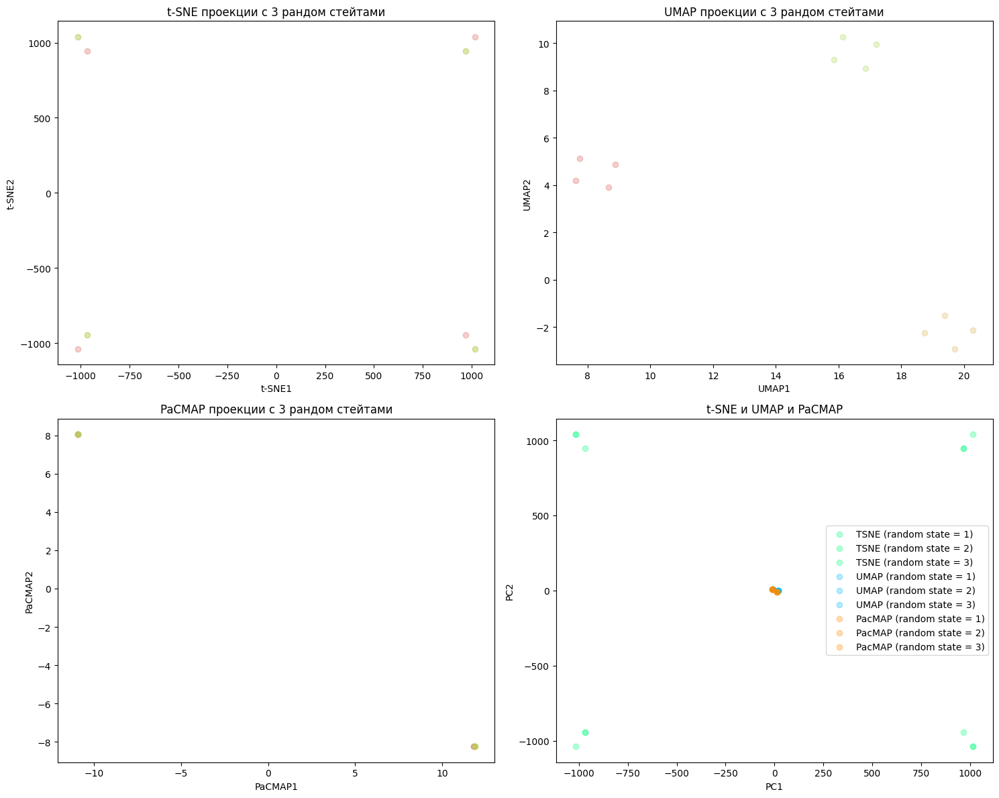

df_16


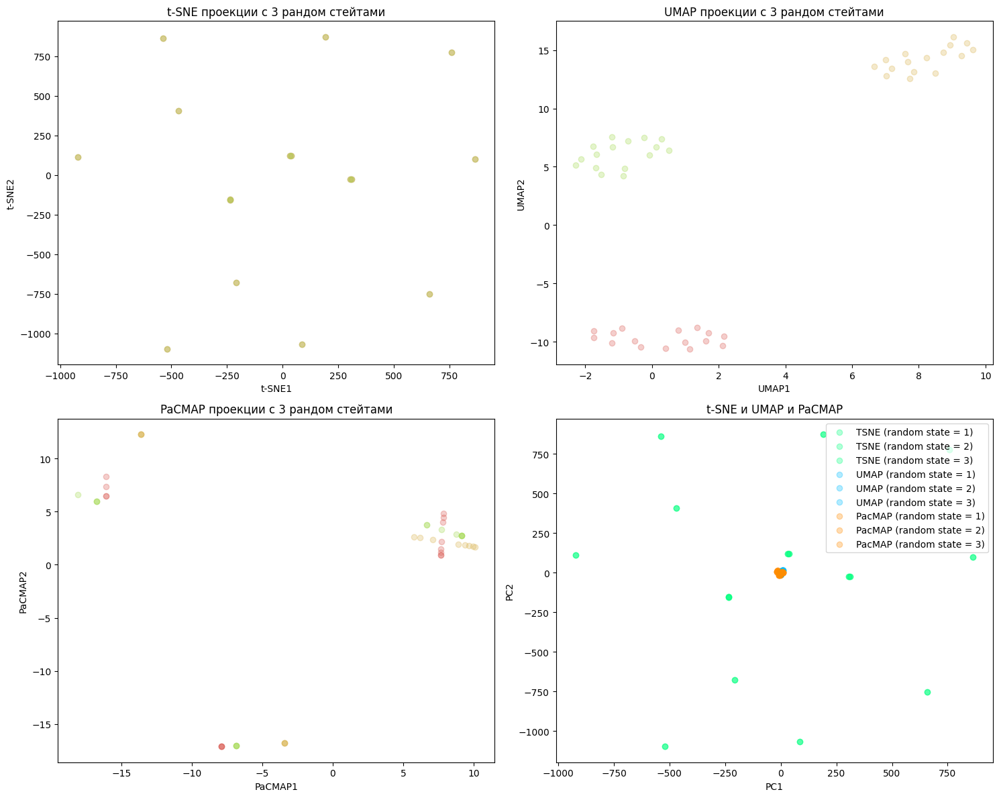

df_256


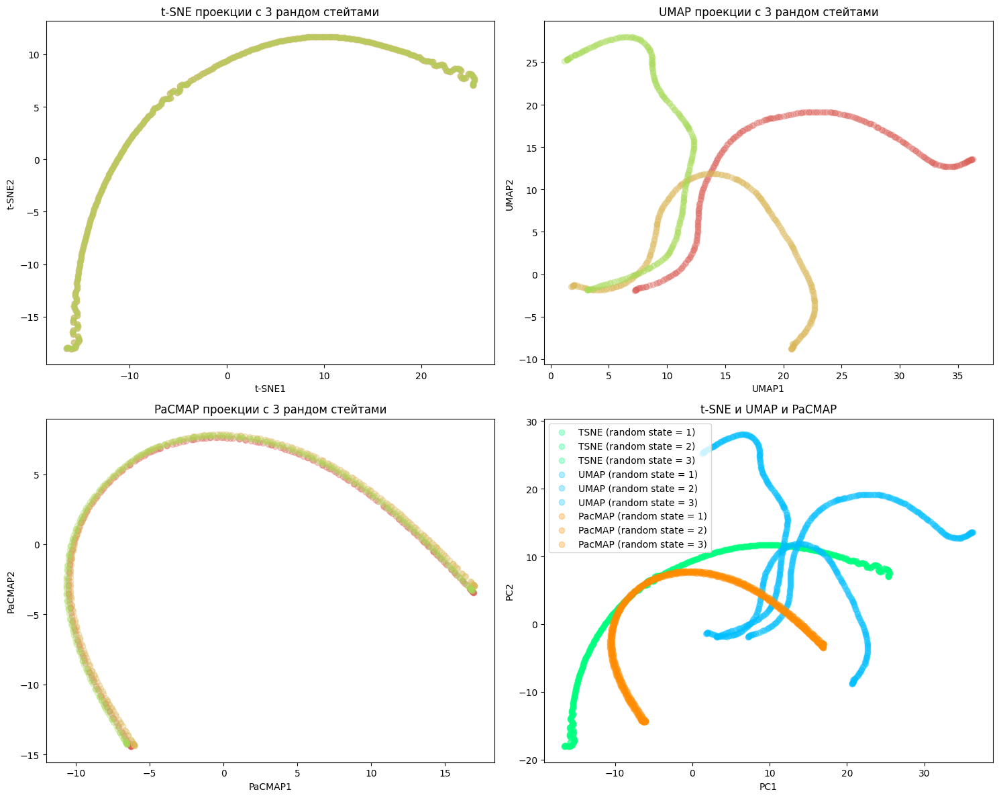

In [ ]:
for df_name in datasets.keys():
  print(df_name)
  visualize_methods(datasets[df_name])

df_4_pca


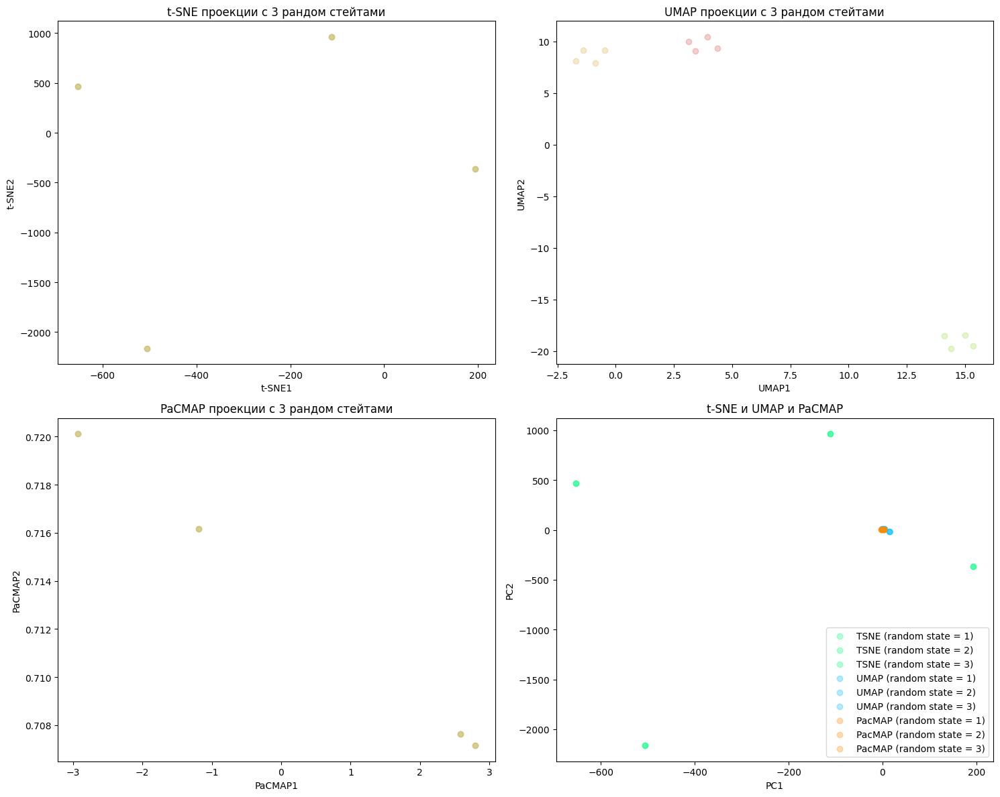

df_16_pca


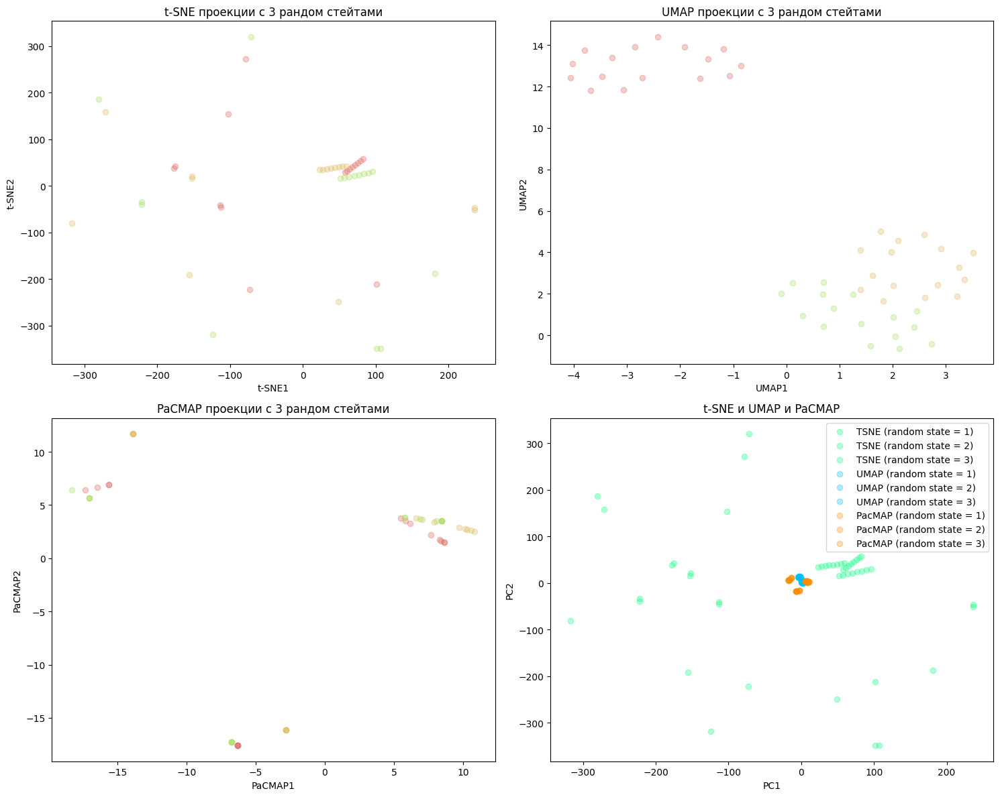

df_256_pca


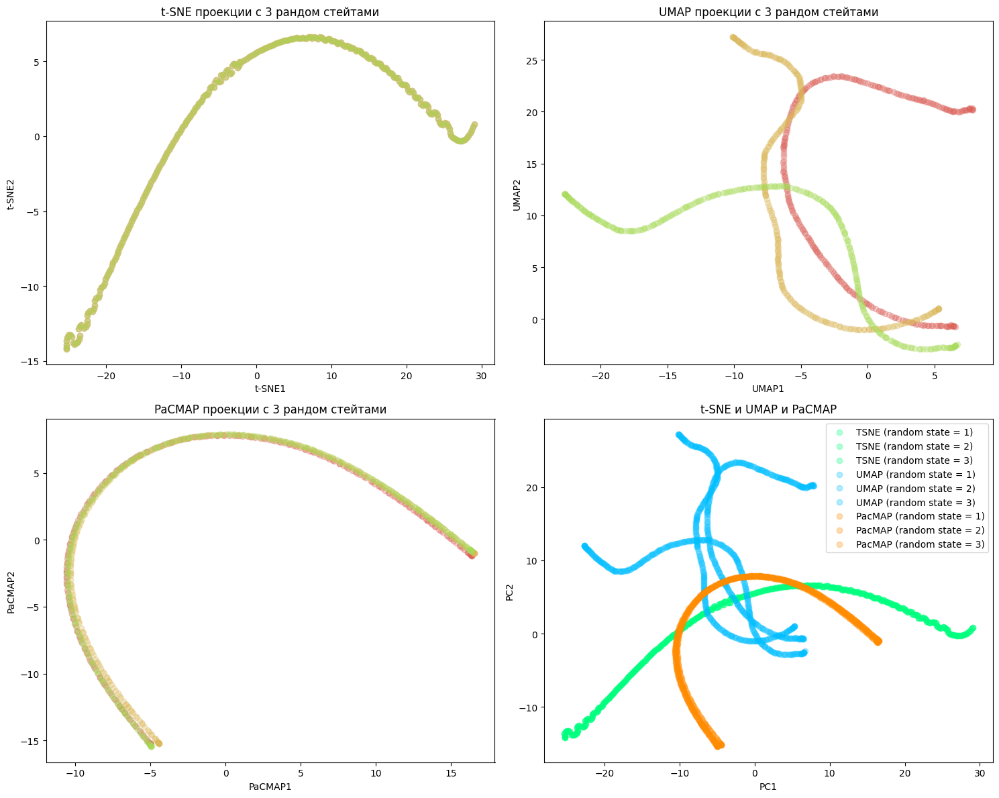

In [ ]:
for df_name in datasets_pca.keys():
  print(df_name)
  visualize_methods(datasets_pca[df_name][0])

df_4


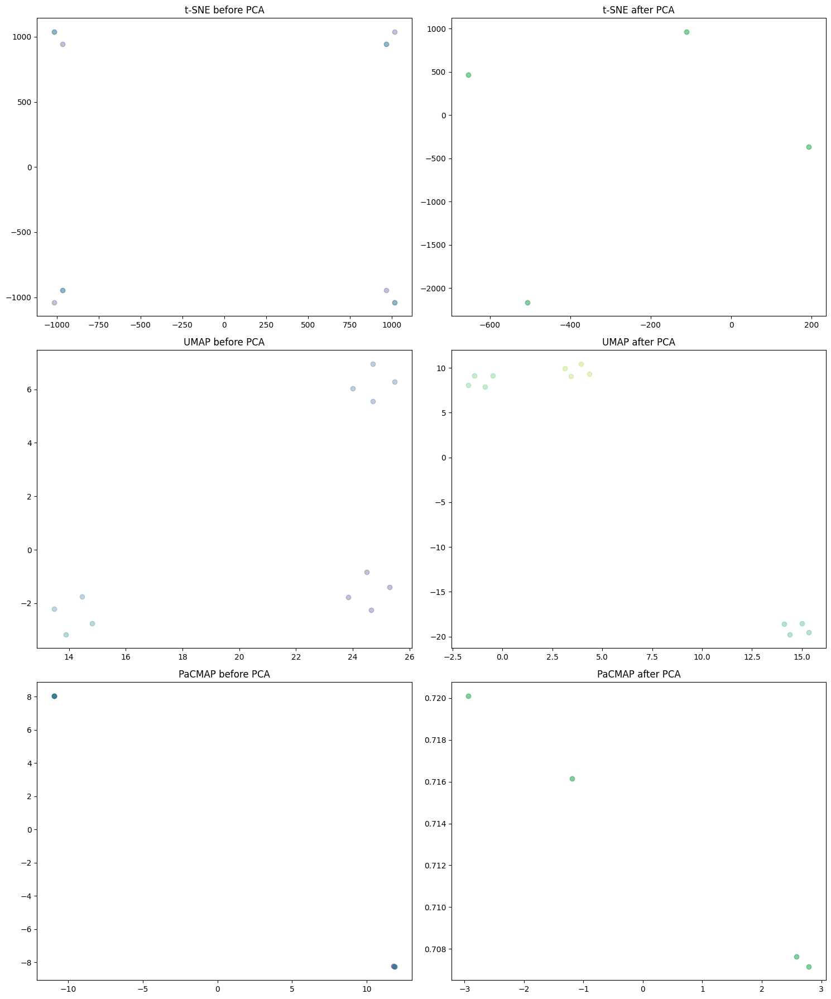

df_16


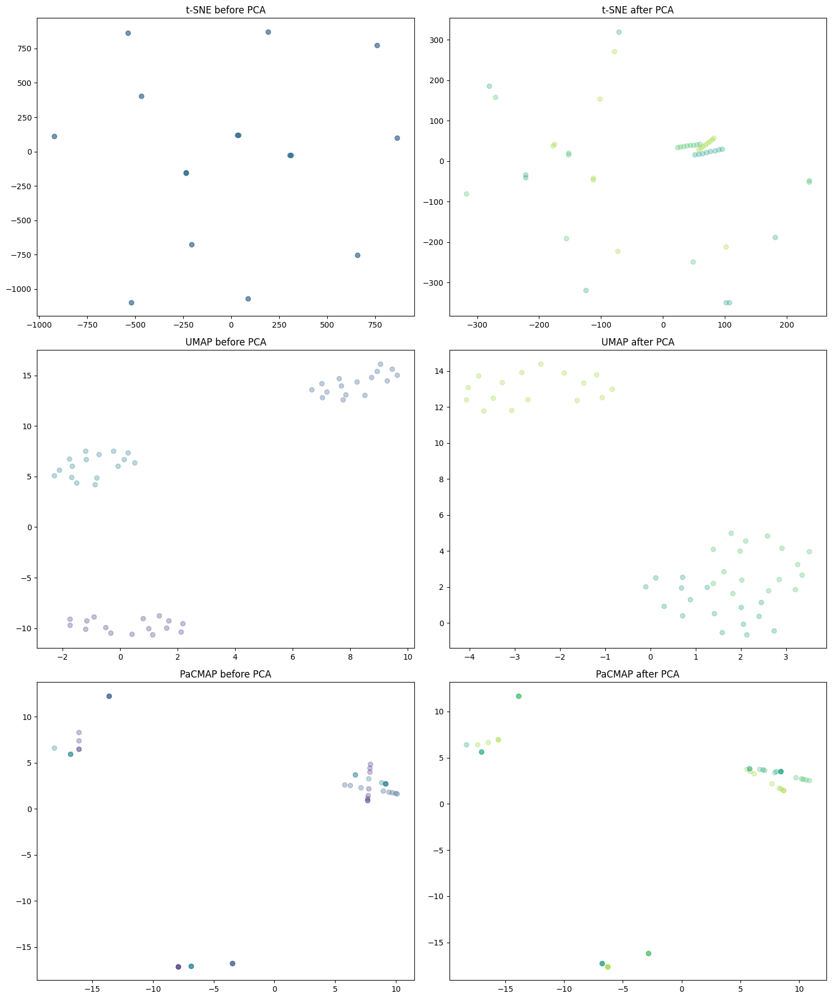

df_256


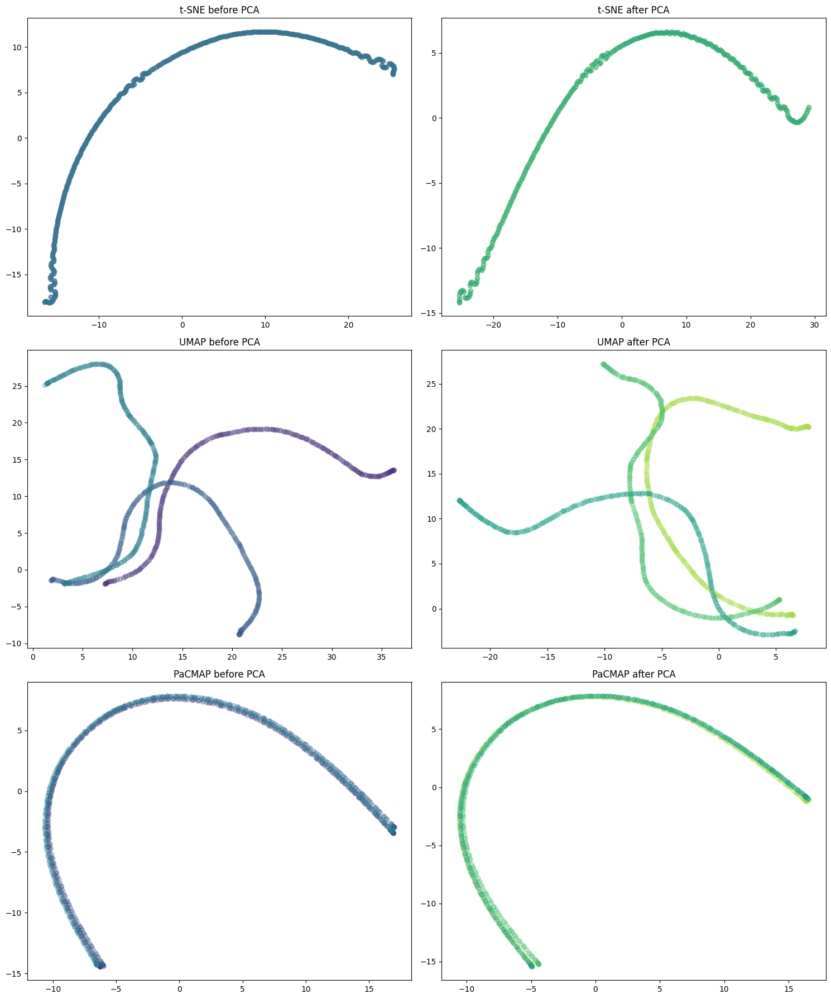

In [ ]:
for df_name in datasets.keys():
  print(df_name)
  visualize_methods_double(df_name)

#Задание 4

In [ ]:
d = 7
df = datasets['df_256']

points = []
labels = []

for x in range(256):
    for y in range(256):
        class_label = df[x, y]

        cluster_points, _ = make_blobs(n_samples=10, centers=[[x, y]], cluster_std=d)
        points.append(cluster_points)
        labels.append(np.full(10, class_label))

points = np.vstack(points)
labels = np.concatenate(labels)

df_256v = pd.DataFrame(points, columns=['x', 'y'])
df_256v['label'] = labels


In [ ]:
df_256v

,x,y,label
0,-4.953163,-7.466412,1.0
1,0.019785,9.562486,1.0
2,-2.553242,15.211214,1.0
3,-10.285432,10.023804,1.0
4,5.866396,1.569866,1.0
...,...,...,...
655355,252.541302,257.665063,1.0
655356,255.878970,267.864434,1.0
655357,264.973224,264.105431,1.0
655358,260.615065,271.896510,1.0


In [ ]:
datasets['df_256v'] = df_256v.to_numpy()

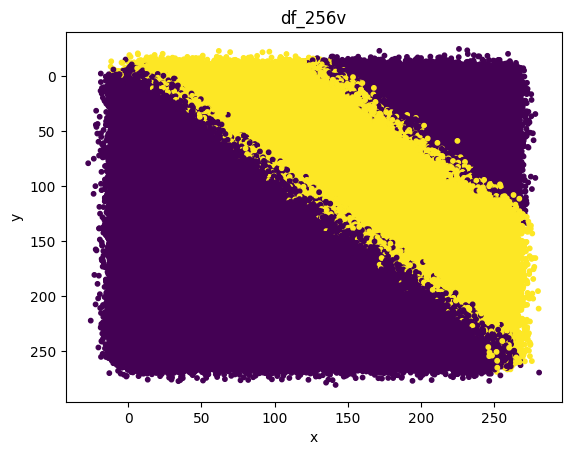

In [ ]:
plt.scatter(df_256v['y'], df_256v['x'], c=df_256v['label'], cmap='viridis', s=10)
plt.gca().invert_yaxis()
plt.title('df_256v')
plt.xlabel('x')
plt.ylabel('y')
plt.show()

#Задание 5


In [ ]:
df_256v_pca, df_256v_variances, df_256v_eigenvectors = get_components('df_256v', datasets['df_256v'][:, :-1])
datasets_pca['df_256v_pca'] = (df_256v_pca, df_256v_variances, df_256v_eigenvectors)

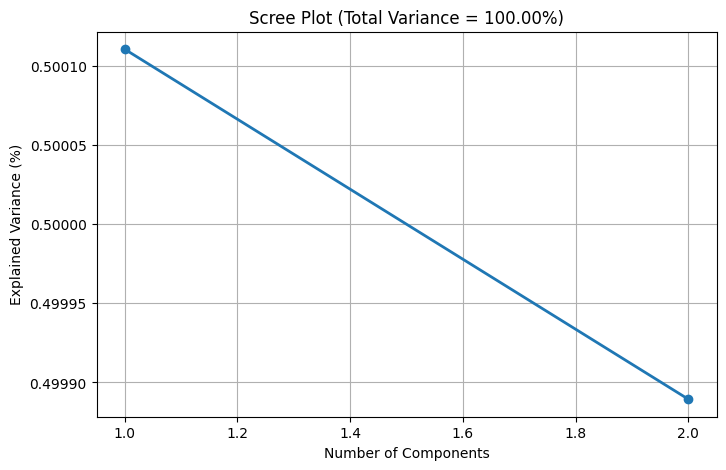

In [ ]:
scree_plot(df_256v_variances)

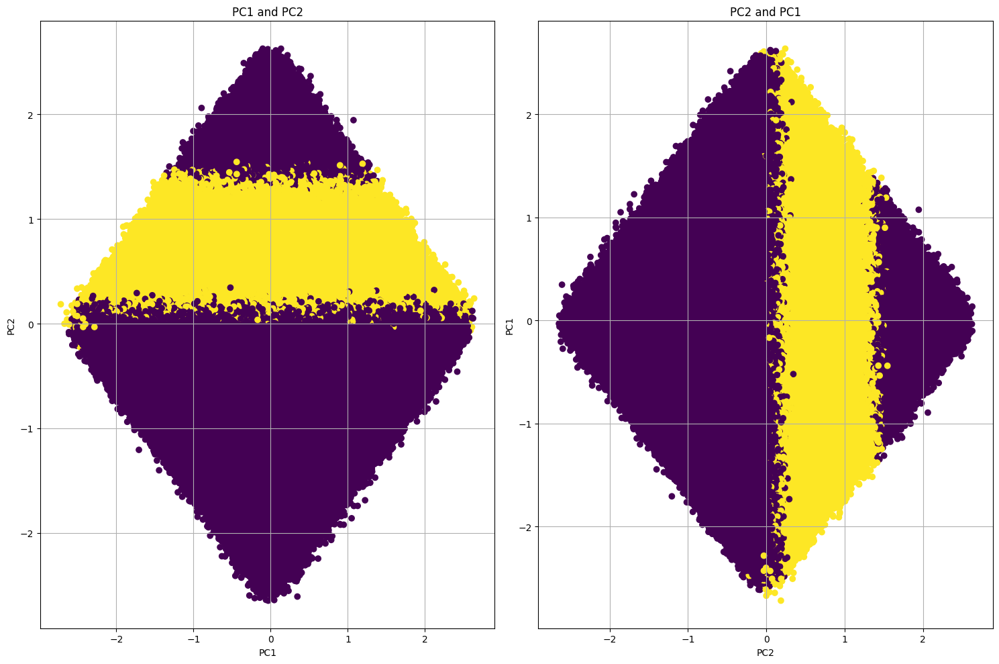

In [ ]:
visualization_pca(df_256v_pca, a=2, labels = labels)

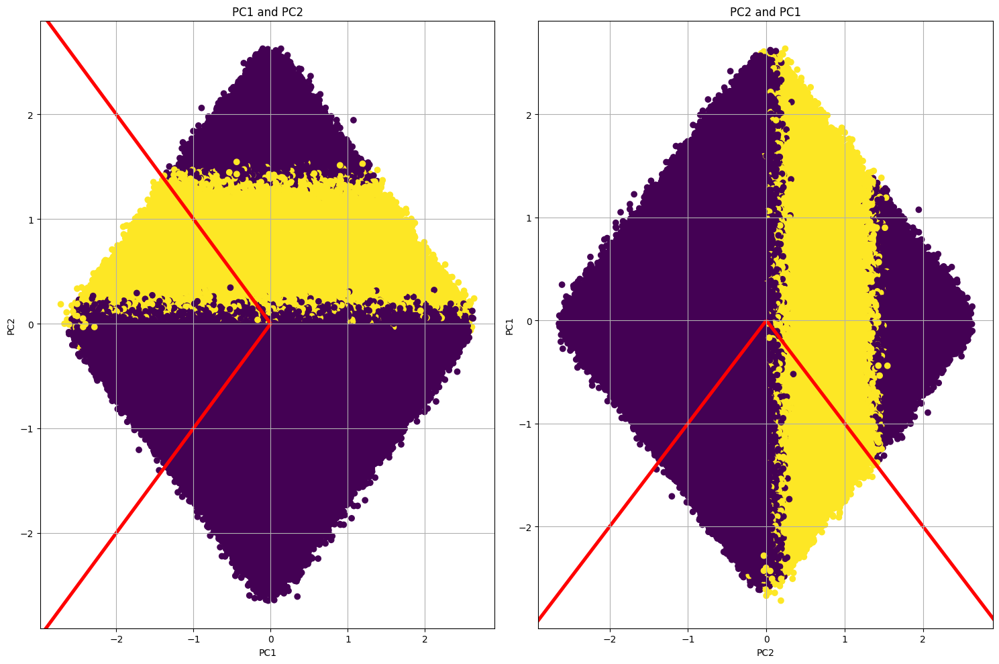

In [ ]:
visualization_pca(df_256v_pca, eigenvectors = df_256v_eigenvectors, a=2, labels = labels)

# Задание 6

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


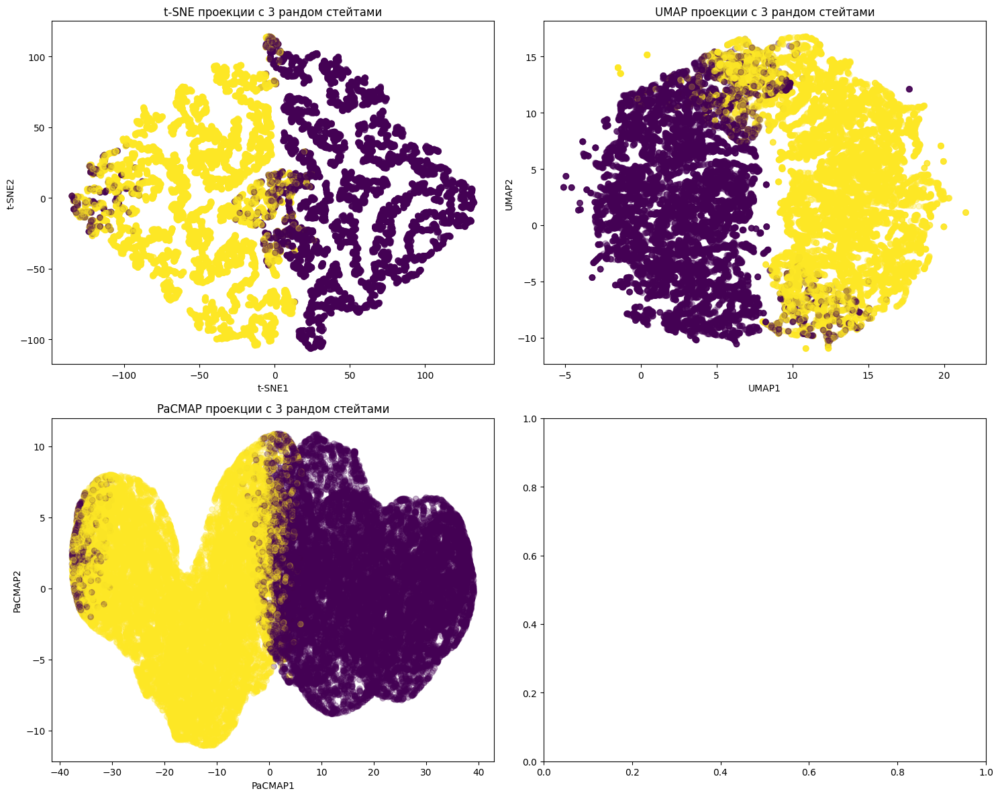

In [ ]:
visualize_methods(datasets['df_256v'], max_len=13000, labels = labels)

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


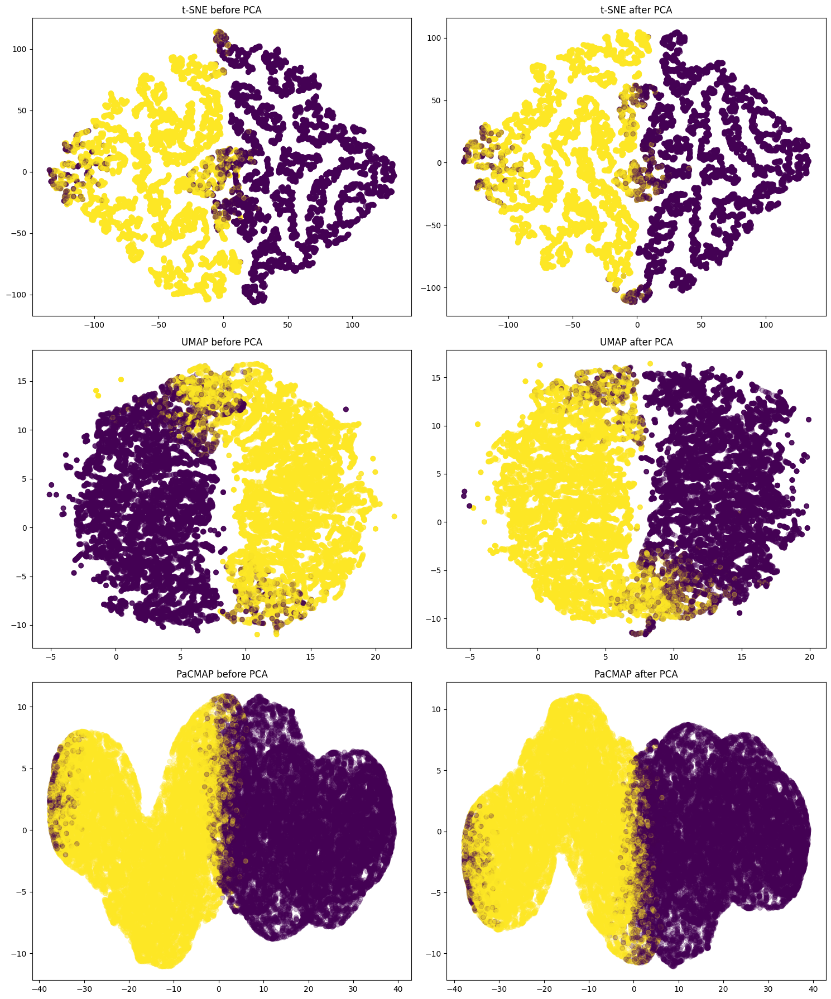

In [ ]:
visualize_methods_double('df_256v', max_len = 13000, labels = labels)

# Задание 7


In [ ]:
path = '/content/drive/MyDrive/Colab Notebooks/globalterrorismdb_0718dist.csv'

df_csv = pd.read_csv(path, encoding='ISO-8859-1')

<ipython-input-75-70bb6f7517ea>:3: DtypeWarning: Columns (4,6,31,33,61,62,63,76,79,90,92,94,96,114,115,121) have mixed types. Specify dtype option on import or set low_memory=False.
  df_csv = pd.read_csv(path, encoding='ISO-8859-1')


In [ ]:
#Оставил только столбцы с числовыми значениями
df_csv = df_csv.select_dtypes(include=['number'])

#Обрезал, а то будет очень долго все считать
df_csv = df_csv.iloc[:25000, :15].drop(columns = 'eventid')
df_csv = df_csv.dropna()

df_csv.head()

,iyear,imonth,iday,extended,country,region,latitude,longitude,specificity,vicinity,crit1,crit2,crit3,doubtterr
0,1970,7,2,0,58,2,18.456792,-69.951164,1.0,0,1,1,1,0.0
1,1970,0,0,0,130,1,19.371887,-99.086624,1.0,0,1,1,1,0.0
2,1970,1,0,0,160,5,15.478598,120.599741,4.0,0,1,1,1,0.0
3,1970,1,0,0,78,8,37.997490,23.762728,1.0,0,1,1,1,0.0
4,1970,1,0,0,101,4,33.580412,130.396361,1.0,0,1,1,1,-9.0


In [ ]:
'''Целевой класс - регион'''

classes = np.unique(df_csv['region'])

print('Количество классов -',len(classes))
print('Количество строк - ', df_csv.shape[0])
print('Количество столбцов - ', df_csv.shape[1])

Количество классов - 11
Количество строк -  23766
Количество столбцов -  14


In [ ]:
for class_id in classes:
  print(f'Количество экземпляров {class_id} класса = {(len(df_csv[df_csv["region"] == class_id]))}')

Количество экземпляров 1 класса = 1955
Количество экземпляров 2 класса = 5424
Количество экземпляров 3 класса = 4843
Количество экземпляров 4 класса = 117
Количество экземпляров 5 класса = 377
Количество экземпляров 6 класса = 429
Количество экземпляров 8 класса = 7299
Количество экземпляров 9 класса = 42
Количество экземпляров 10 класса = 2636
Количество экземпляров 11 класса = 610
Количество экземпляров 12 класса = 34


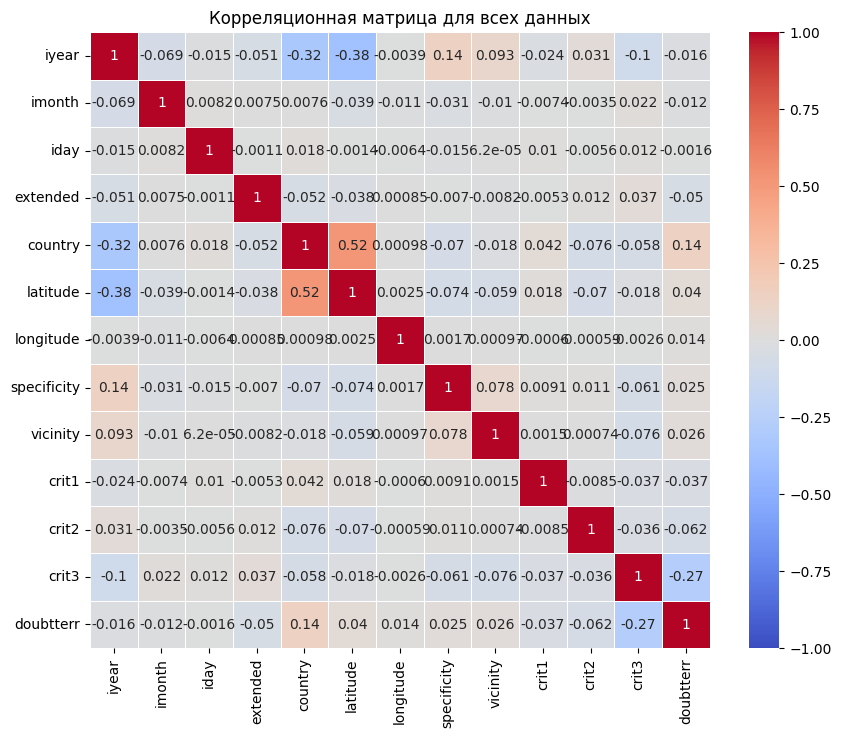

In [ ]:
correlation_all = df_csv.drop(columns='region').corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_all, annot=True, cmap='coolwarm', vmin=-1, vmax=1, linewidths=0.5)
plt.title('Корреляционная матрица для всех данных')

plt.show()

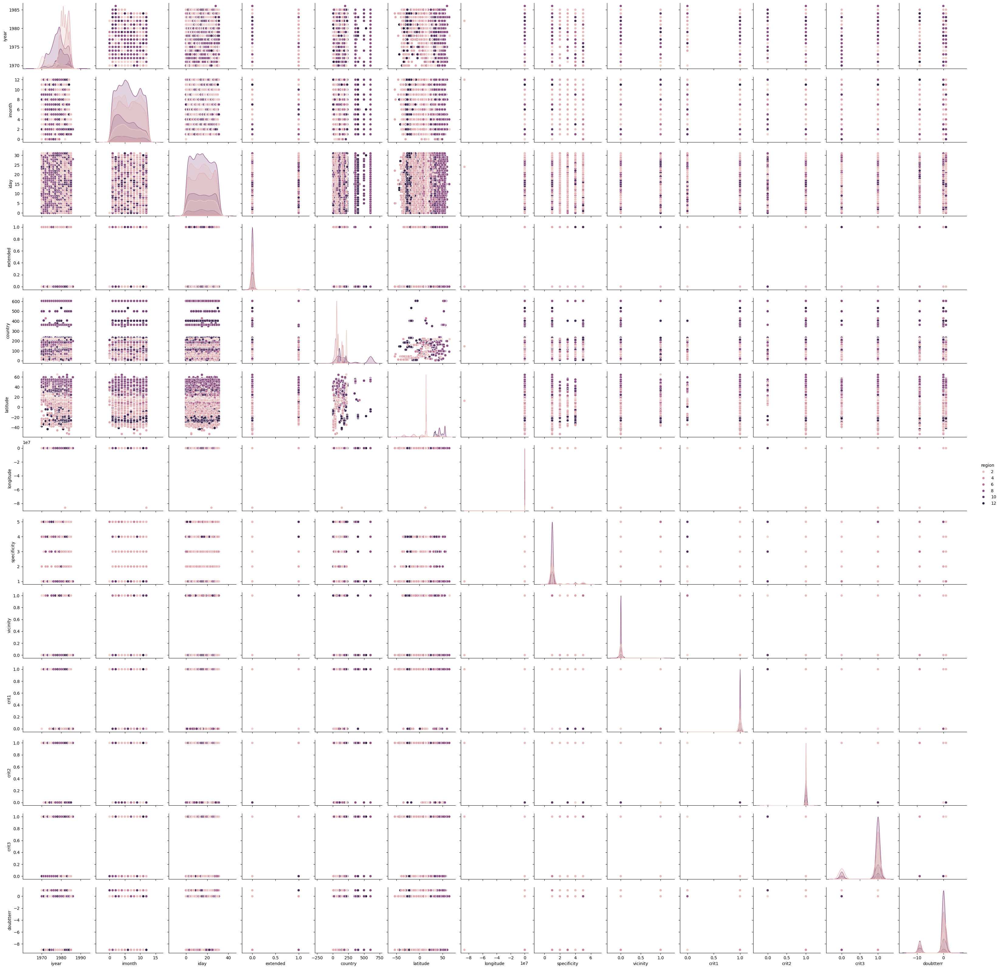

In [ ]:
sns.pairplot(df_csv, hue = 'region')
plt.show()

#Задание 8

In [ ]:
datasets['df_csv'] = df_csv.to_numpy()
df_csv_pca, csv_variances, csv_eigenvectors = get_components('df_csv', datasets['df_csv'])

datasets_pca['df_csv_pca'] = (df_csv_pca, csv_variances, csv_eigenvectors)

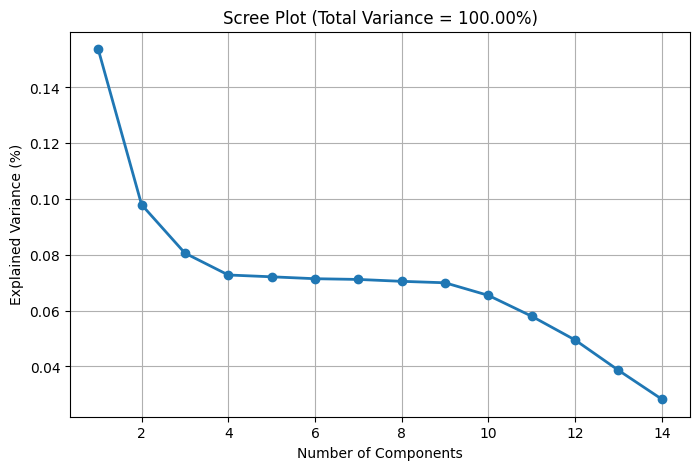

In [ ]:
scree_plot(csv_variances)

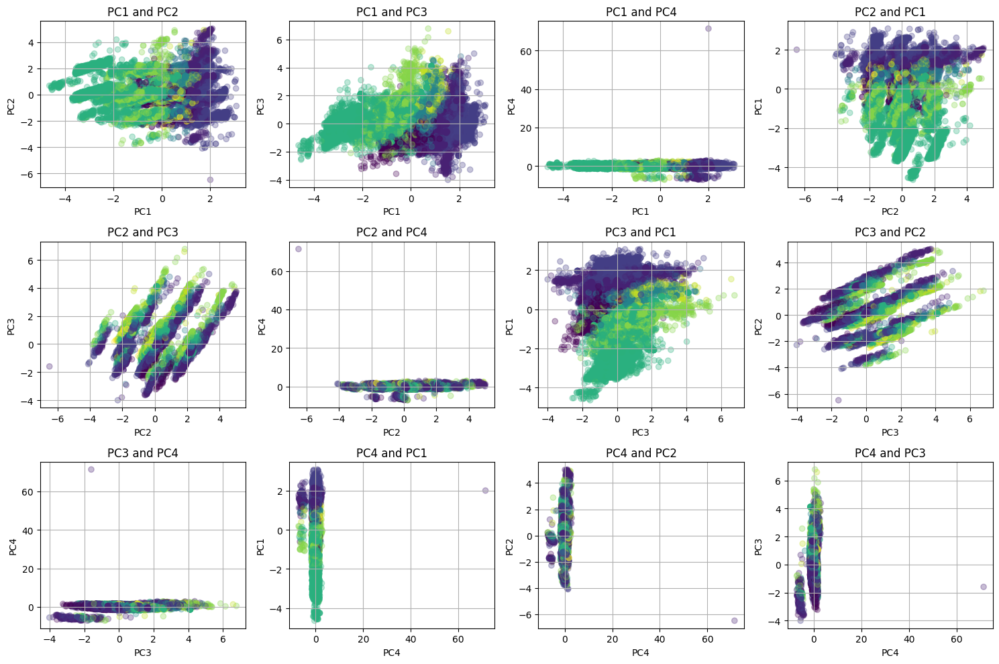

In [ ]:
3visualization_pca(df_csv_pca, labels = df_csv['region'])

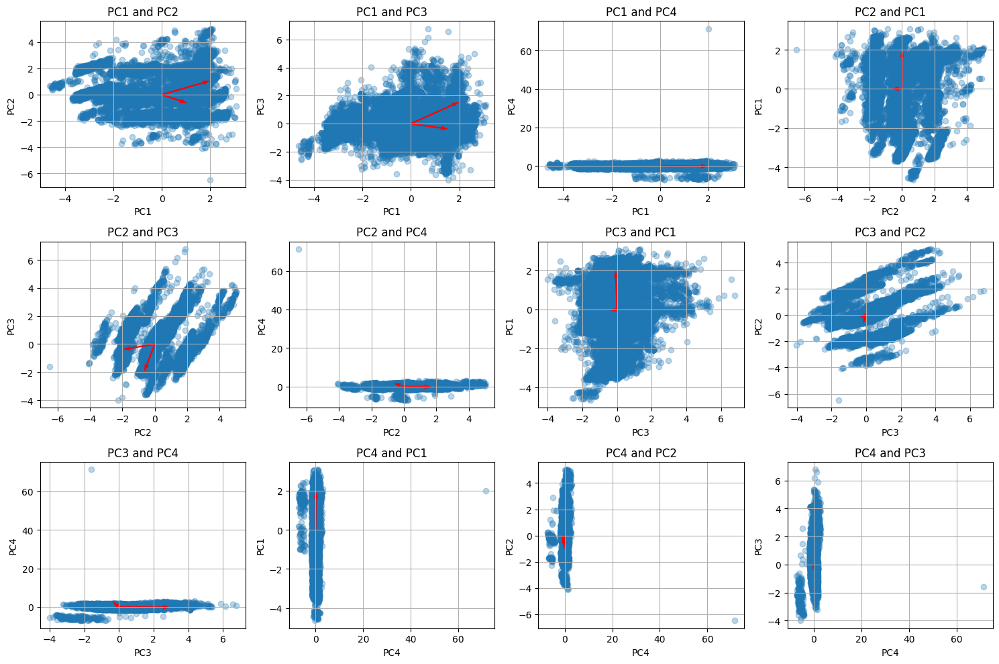

In [ ]:
visualization_pca(df_csv_pca, eigenvectors = csv_eigenvectors)

**Метод Кайзера**

In [ ]:
scaler = StandardScaler()
df_csv_scaled = scaler.fit_transform(datasets['df_csv'])

pca = PCA()
pca.fit(df_csv_scaled)

eigenvalues = pca.explained_variance_

n_components_kaiser = np.sum(eigenvalues > 1)


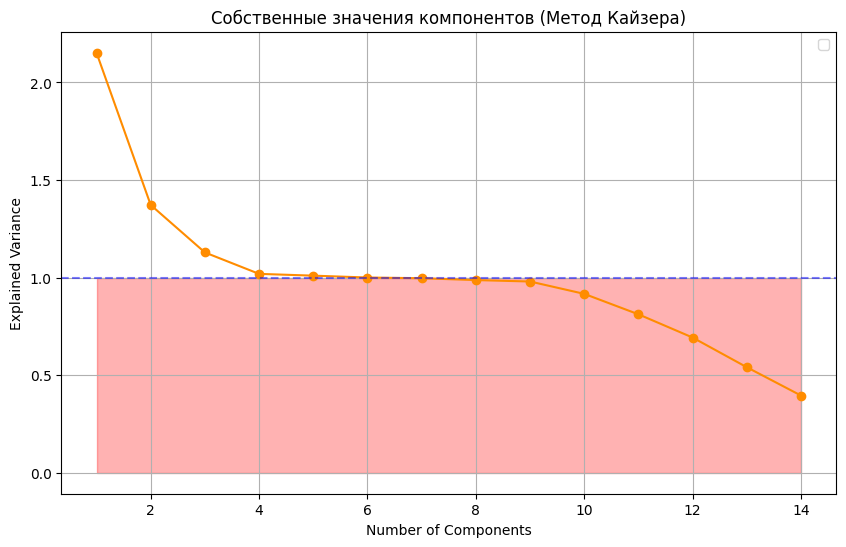

Количество компонент по методу Кайзера: 6


In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(eigenvalues) + 1), eigenvalues, marker='o', linestyle='-', color='darkorange')
plt.axhline(1, color='blue', linestyle='--', alpha = 0.5)
plt.fill_between(range(1, len(eigenvalues) + 1), 0, 1, color='red', alpha=0.3)
plt.title('Собственные значения компонентов (Метод Кайзера)')
plt.xlabel('Number of Components')
plt.ylabel('Explained Variance')
plt.legend()
plt.grid(True)
plt.show()

print(f"Количество компонент по методу Кайзера: {n_components_kaiser}")

**Метод сломанной трости**

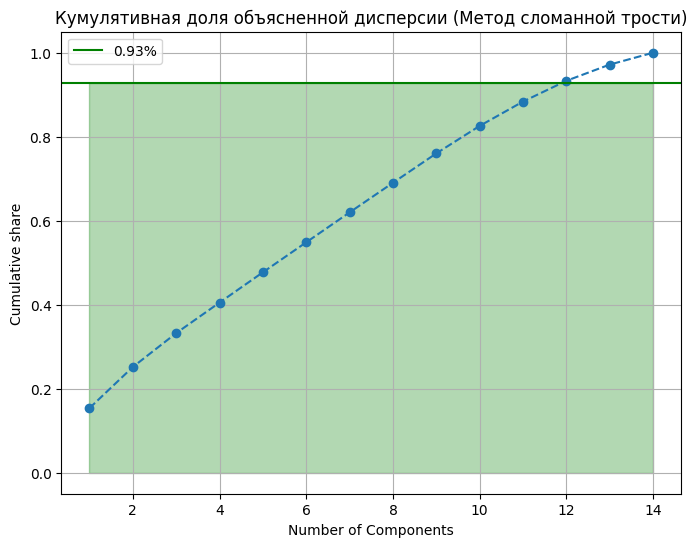

Количество компонент по методу сломанной трости: 11


In [ ]:
explained_variance_ratio_cumsum = np.cumsum(pca.explained_variance_ratio_)
threshold = 13/14

num_components = np.argmax(explained_variance_ratio_cumsum >= threshold)

plt.figure(figsize=(8, 6))
plt.plot(range(1, 14 + 1), explained_variance_ratio_cumsum, marker='o', linestyle='--')

plt.title('Кумулятивная доля объясненной дисперсии (Метод сломанной трости)')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative share')
plt.fill_between(range(1, len(eigenvalues) + 1), threshold, 0, color='green', alpha=0.3)
plt.axhline(y=threshold, color='g', linestyle='-', label=f'{threshold:.2f}%')
plt.grid(True)
plt.legend()
plt.show()

print(f"Количество компонент по методу сломанной трости: {num_components}")

#9 задание

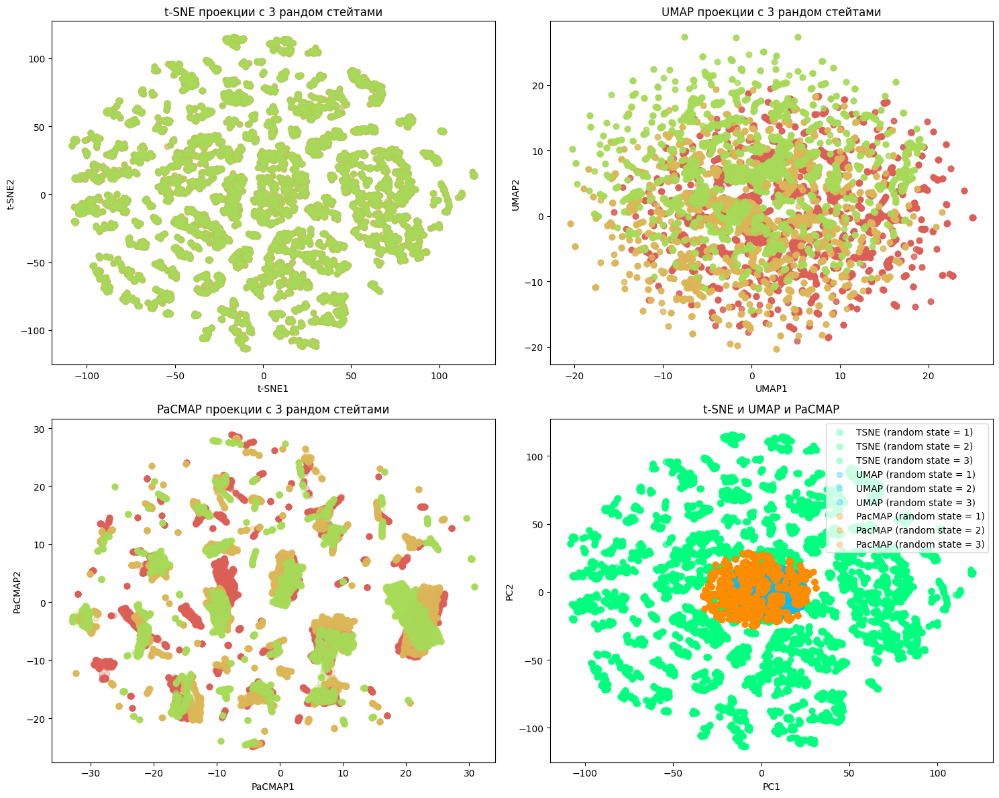

In [ ]:
visualize_methods(datasets['df_csv'], max_len=10000)

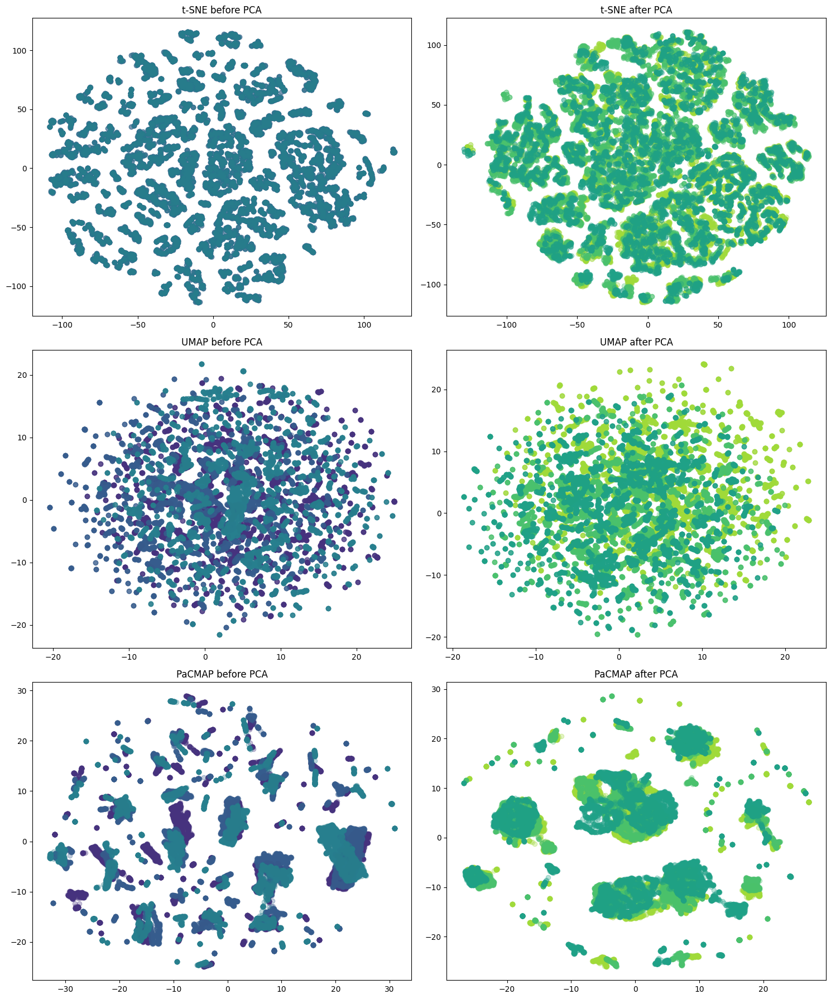

In [ ]:
visualize_methods_double('df_csv', max_len=10000)